# Graph and mapping libraries in Python

Examples of graph and mapping libraries in Python:

| Library     | Description |
| --- | --- | 
| [networkx](https://networkx.org/) | Python library for studying graphs and networks. | 
| [osmnx](https://osmnx.readthedocs.io/en/stable/)|Python package to download, model, analyze, and visualize street networks and other geospatial features from OpenStreetMap.|
| [GeoPandas](https://geopandas.org/en/stable/)| Open source project to make working with geospatial data in python easier.|
| [contextily](https://contextily.readthedocs.io/en/latest/)|  Python 3 (3.7 and above) package to retrieve tile maps from the internet.|
| [folium](https://python-visualization.github.io/folium/)| for interactive geographic visualizations.|
| [leafmap](https://leafmap.org//)| A Python package for geospatial analysis and interactive mapping in a Jupyter environment.|
| [pyrosm](https://pyrosm.readthedocs.io/en/latest/)| Python library for reading OpenStreetMap from Protocolbuffer Binary Format -files (*.osm.pbf) into Geopandas GeoDataFrames. |
| [Pandana](https://udst.github.io/pandana/)| Python library for network analysis that uses contraction hierarchies to calculate super-fast travel accessibility metrics and shortest paths.|
| [OSMPythonTools](https://github.com/mocnik-science/osm-python-tools)| is a well-written package to query OSM services.|
| [Open layers](https://openlayers.org/)| makes it easy to put a dynamic map in any web page.|
| [Plotly Dash](https://dash.plotly.com/)| is a low-code framework for rapidly building interactive data apps in Python.|

## networkx

This is one of the pillars of Python programming and scientific computing, besides `numpy` and `scipy`. Its main and only goal is supporting graph data structures and the associated algorithms like shortest path and networks flow and optimization. `osmnx` returns the map as `networkx` network so it is possible to use all the library's functions on the maps obtained from OSM. `networkx` has books written explaining its API's and we wholeheartedly recommend [Complex Network Analysis in Python: Recognize - Construct - Visualize - Analyze - Interpret](https://www.amazon.com/Complex-Network-Analysis-Python-Recognize/dp/1680502697) if you want to dive into it. Information about `networkx` is also available [here](https://networkx.github.io/). 

`networkx` has a monopoly over the field of network analysis for many years now, but the scalability of `networkx` may be an issue. If your network has tens of millions of nodes, it can get really ugly because `networkx` is still just a `python` library, and `python` can't handle these millions of nodes and will run out of memory, and give you a segmentation fault.

In [84]:
# !pip install networkx[default]

The route of the salesman is: [0, 10, 7, 2, 6, 1, 15, 14, 5, 17, 4, 9, 12, 18, 3, 19, 16, 8, 11, 13, 0]


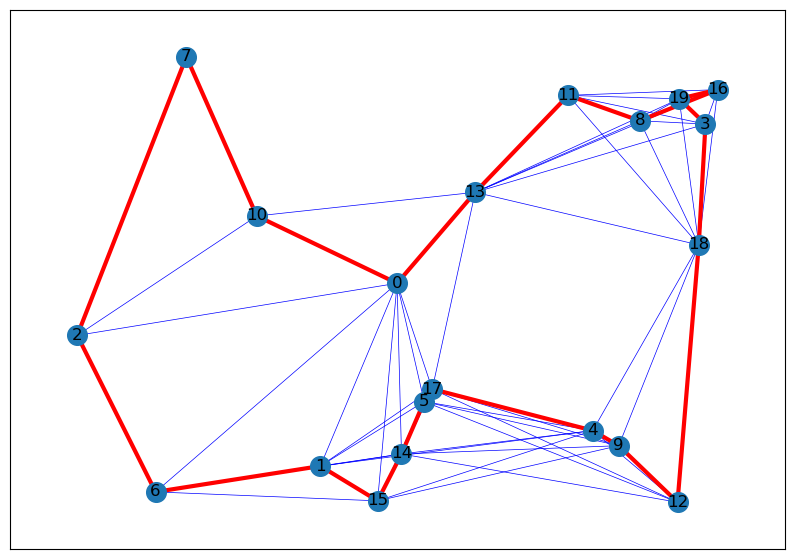

In [85]:
import matplotlib.pyplot as plt
import networkx as nx
import networkx.algorithms.approximation as nx_app
import math

plt.figure(figsize=(10, 7))

# Create a random geometric graph with 20 nodes
G = nx.random_geometric_graph(20, radius=0.4, seed=4)
pos = nx.get_node_attributes(G, "pos")

# Depot should be at (0,0)
pos[0] = (0.5, 0.5)

# Create an independent shallow copy of the graph and attributes
H = G.copy()

# Calculating the distances between the nodes as edge's weight.
for i in range(len(pos)):
    for j in range(i + 1, len(pos)):
        dist = math.hypot(pos[i][0] - pos[j][0], pos[i][1] - pos[j][1]) #square root of the sum of squares
        dist = dist
        G.add_edge(i, j, weight=dist)

# solve tsp using Christofides algorithm 
cycle = nx_app.christofides(G, weight="weight")
edge_list = list(nx.utils.pairwise(cycle))

# Draw closest edges on each node only
nx.draw_networkx_edges(H, pos, edge_color="blue", width=0.5)

# Draw the route
nx.draw_networkx(
    G,
    pos,
    with_labels=True,
    edgelist=edge_list,
    edge_color="red",
    node_size=200,
    width=3,
)

print("The route of the salesman is:", cycle)
plt.show()
# plt.savefig('A1_F01_Christofides.png', format='png', dpi=300)

## osmnx

This library was developed to ease the process of retrieving and manipulating the data from OpenStreetMap, and to make it easier to be interpolated into Python applications. It offers the ability to download the data (filtered) from OSM and returns the network as `networkx` graph data structure. The library is too complicated to be explained fully in a README file, but you can check the [official website](https://osmnx.readthedocs.io/en/stable/) and follow Professor Boeing's website as he posts regularly on recent updates and trends about osmnx and the field in general.

In [86]:
# !conda create -n ox -c conda-forge --strict-channel-priority osmnx

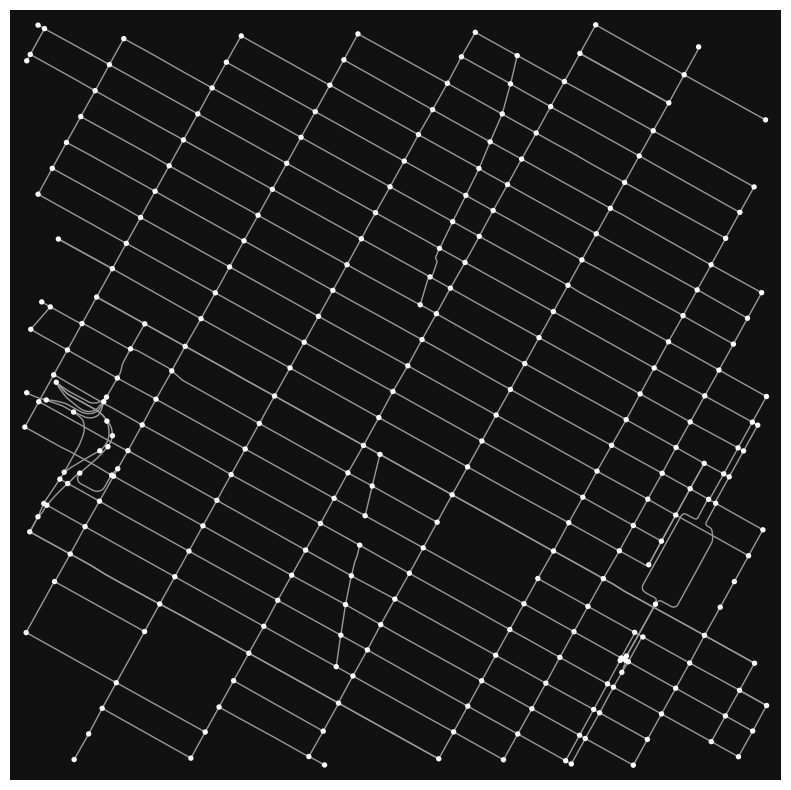

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [87]:
import osmnx as ox
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

place_name = "Times Square, NY"


# networkx graph of the named place
graph = ox.graph_from_address(place_name, network_type='drive')

# Plot the graphs
ox.plot_graph(graph,figsize=(10,10), save=True, filepath='A1_F02_TimesSquare.png')

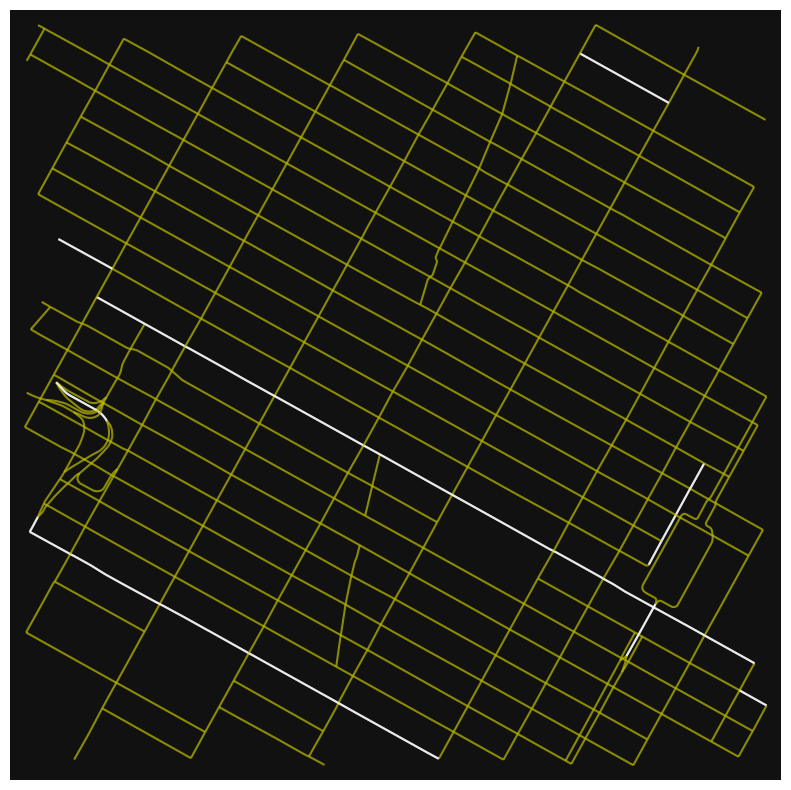

In [88]:
# highlight all one-way edges in Time Square street network
ec = ['y' if data['oneway'] else 'w' for u, v, key, data in graph.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(graph, figsize=(10,10), node_size=0, edge_color=ec, edge_linewidth=1.5, edge_alpha=0.7)

In [89]:
# type of the graph
type(graph)

networkx.classes.multidigraph.MultiDiGraph

In [90]:
# extract the nodes and the edges of the graph
nodes, edges = ox.graph_to_gdfs(graph)

#print first 5 nodes
nodes.head(5)

,y,x,street_count,highway,geometry
osmid,,,,,
42423836,40.759388,-73.996954,3,NaN,POINT (-73.99695 40.75939)
42423885,40.757743,-73.996846,4,traffic_signals,POINT (-73.99685 40.75774)
42424789,40.757665,-73.994811,4,traffic_signals,POINT (-73.99481 40.75767)
42427764,40.763914,-73.974107,3,traffic_signals,POINT (-73.97411 40.76391)
42427812,40.749056,-73.995729,4,traffic_signals,POINT (-73.99573 40.74906)


In [91]:
#print first 5 edges
edges.head(5)

osmid  oneway lanes  \
u        v         key                                           
42423836 593920879 0                    46435657    True     1   
         42446506  0                     5669227    True     2   
42423885 42446504  0    [1041012064, 1041012063]    True     5   
42424789 42434434  0                    46492638    True     5   
         42444991  0      [847002232, 273895450]    True     3   

                                    name       highway maxspeed  reversed  \
u        v         key                                                      
42423836 593920879 0    West 41st Street  unclassified   25 mph     False   
         42446506  0       Galvin Avenue     secondary   25 mph     False   
42423885 42446504  0         10th Avenue       primary   25 mph     False   
42424789 42434434  0         Dyer Avenue       primary      NaN     False   
         42444991  0    West 40th Street   residential      NaN     False   

                         length  \
u        v         key            
42423836 593920879 0     26.681   
         42446506  0     79.950   
42423885 42446504  0     76.586   
42424789 42434434  0     86.701   
         42444991  0    118.429   

                                                                 geometry  \
u        v         key                                                      
42423836 593920879 0    LINESTRING (-73.99695 40.75939, -73.99723 40.7...   
         42446506  0    LINESTRING (-73.99695 40.75939, -73.99701 40.7...   
42423885 42446504  0    LINESTRING (-73.99685 40.75774, -73.99680 40.7...   
42424789 42434434  0    LINESTRING (-73.99481 40.75767, -73.99478 40.7...   
         42444991  0    LINESTRING (-73.99481 40.75767, -73.99469 40.7...   

                          width access bridge tunnel  ref  
u        v         key                                     
42423836 593920879 0        NaN    NaN    NaN    NaN  NaN  
         42446506  0        NaN    NaN    NaN    NaN  NaN  
42423885 42446504  0    69.6 ft    NaN    NaN    NaN  NaN  
42424789 42434434  0        NaN    NaN    NaN    NaN  NaN  
         42444991  0        NaN    NaN    NaN    NaN  NaN

In [92]:
# examine each individual node or edge.
list(graph.nodes(data=True))[1]

(42423885,
 {'y': 40.7577433,
  'x': -73.9968456,
  'highway': 'traffic_signals',
  'street_count': 4})

In [93]:
# Rendering the 1st edge
list(graph.edges(data=True))[0]

(42423836,
 593920879,
 {'osmid': 46435657,
  'oneway': True,
  'lanes': '1',
  'name': 'West 41st Street',
  'highway': 'unclassified',
  'maxspeed': '25 mph',
  'reversed': False,
  'length': np.float64(26.681)})

In [94]:
print(edges['highway'].value_counts())

highway
secondary                      216
residential                    121
primary                        107
unclassified                    18
motorway_link                   12
tertiary                        10
motorway                         6
living_street                    3
trunk                            2
[unclassified, residential]      1
[primary, motorway_link]         1
Name: count, dtype: int64


In [95]:
# more statistics
ox.basic_stats(graph)

{'n': 273,
 'm': 497,
 'k_avg': 3.641025641025641,
 'edge_length_total': np.float64(67754.5920000001),
 'edge_length_avg': np.float64(136.32714688128794),
 'streets_per_node_avg': 3.827838827838828,
 'streets_per_node_counts': {0: 0, 1: 1, 2: 3, 3: 40, 4: 227, 5: 2},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.003663003663003663,
  2: 0.01098901098901099,
  3: 0.14652014652014653,
  4: 0.8315018315018315,
  5: 0.007326007326007326},
 'intersection_count': 272,
 'street_length_total': np.float64(63255.61900000007),
 'street_segment_count': 472,
 'street_length_avg': np.float64(134.01614194915268),
 'circuity_avg': np.float64(1.0054296233387245),
 'self_loop_proportion': 0.0}

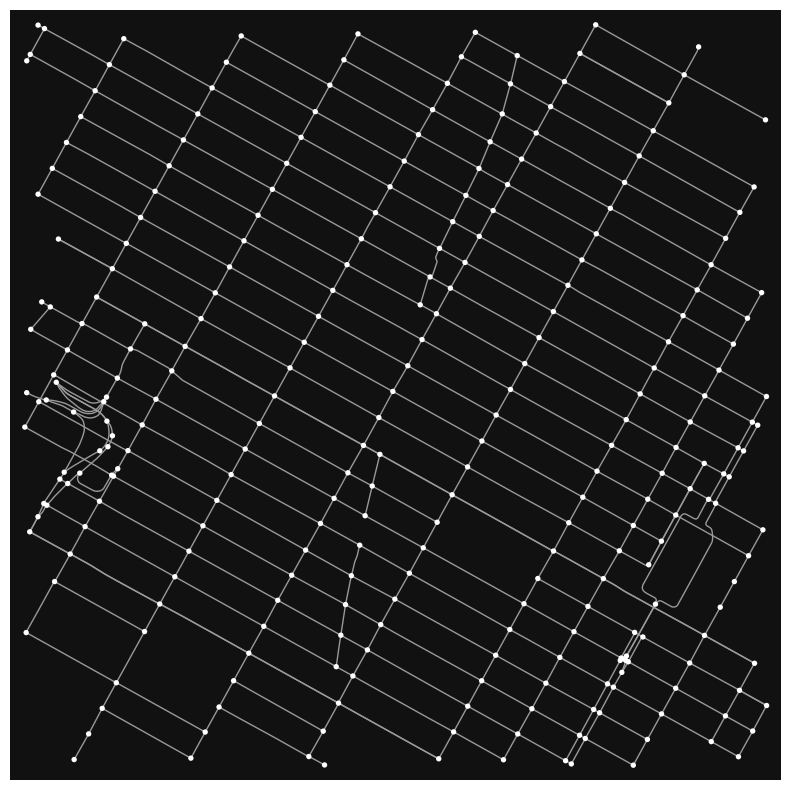

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [96]:
# GeoDataFrame to MultiDiGraph
new_graph = ox.graph_from_gdfs(nodes,edges)
ox.plot_graph(new_graph,figsize=(10,10))

In [97]:
# # save street network as PNG
# ox.plot_graph(graph, figsize=(10,10), show=False, save=True, close=True, filepath='./data/TimesSquare.png')

# # save street network as SVG
# ox.plot_graph(graph, figsize=(10,10), show=False, save=True, close=True, filepath='./data/TimesSquare.svg')

# # save graph to disk as .osm xml file
# ox.save_graph_xml(graph, filepath='./data/TimesSquare.osm')

# # save street network as GeoPackage to work with in GIS
# ox.save_graph_geopackage(graph, filepath='./data/TimesSquare.gpkg')

# # save street network as GraphML file to work with later in OSMnx or networkx or gephi
# ox.save_graphml(graph, filepath='./data/TimesSquare.graphml')

# # save graph as a shapefile
# ox.save_graph_shapefile(graph, filepath='./data/TimesSquare')

## GeoPandas

[GeoPandas](https://geopandas.org/) is an extension to pandas that handles geospatial data by extending the datatypes of pandas, and the ability to query and manipulate spatial data. Alternatively, you would need to deal with [spatial databases](https://en.wikipedia.org/wiki/Spatial_database) for these operations, like how to properly and efficiently represent polygons and curved lines and query them without too much overhead (for database folks, the indexing of spatial data is different than normal data).

In [98]:
# !pip install geopandas

In [99]:
import geopandas as gpd
import requests
import os

# Define the base URL for raw files
base_url = "https://raw.githubusercontent.com/Optimization-Algorithms-Book/Code-Listings/05766c64c5e83dcd6788cc4415b462e2f82e0ccf/Appendix%20B/data/OntarioHealth/"

# Files associated with the shapefile
files = ["Ontario_Health_Regions.shp", "Ontario_Health_Regions.shx", "Ontario_Health_Regions.dbf", "Ontario_Health_Regions.prj"]

# Temporary download each file
for file in files:
    response = requests.get(base_url + file)
    with open(file, 'wb') as f:
        f.write(response.content)

# Read the shapefile with geopandas
ontario =  gpd.read_file("Ontario_Health_Regions.shp")

# Cleanup: Remove downloaded files
for file in files:
    os.remove(file)

print(ontario.head())

     Shape_Leng    Shape_Area   REGION REGION_ID  \
0  4.845977e+06  1.089122e+11     East        04   
1  3.211510e+07  2.232211e+12    North        05   
2  4.860262e+06  7.543033e+10     West        01   
3  2.755817e+06  3.189867e+10  Central        02   
4  2.196396e+05  3.715020e+08  Toronto        03   

                                            geometry  
0  MULTIPOLYGON (((-8631925.914 5449844.839, -863...  
1  MULTIPOLYGON (((-8943097.220 5627248.576, -894...  
2  MULTIPOLYGON (((-9204865.114 5113839.368, -920...  
3  MULTIPOLYGON (((-8872905.739 5371938.215, -887...  
4  MULTIPOLYGON (((-8839514.979 5425932.689, -883...  


<Axes: >

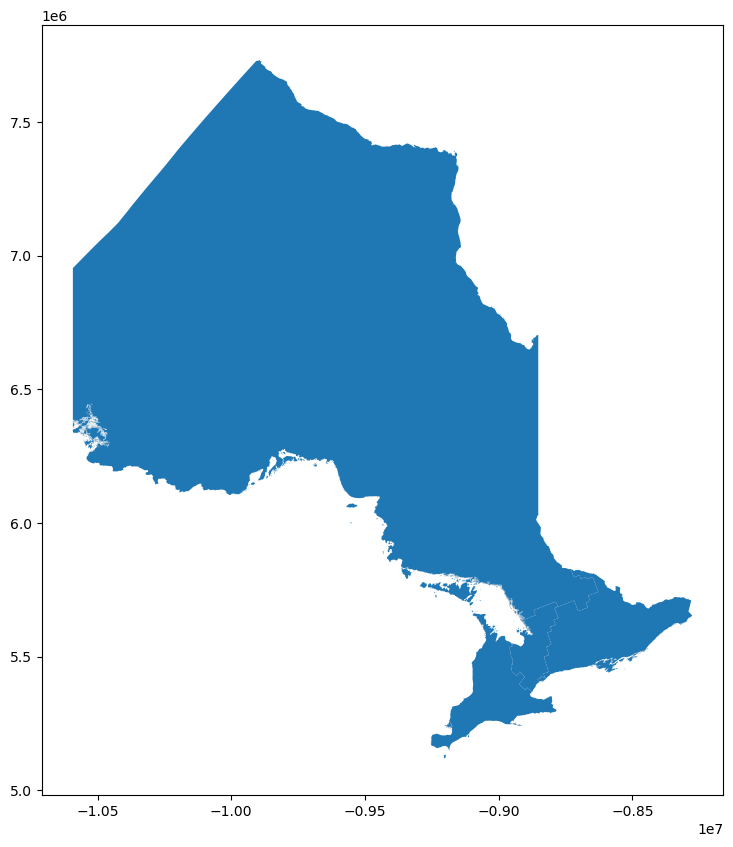

In [100]:
ontario.plot(figsize=(10,10))

Text(0.5, 1.0, 'WGS84 (lat/lon)')

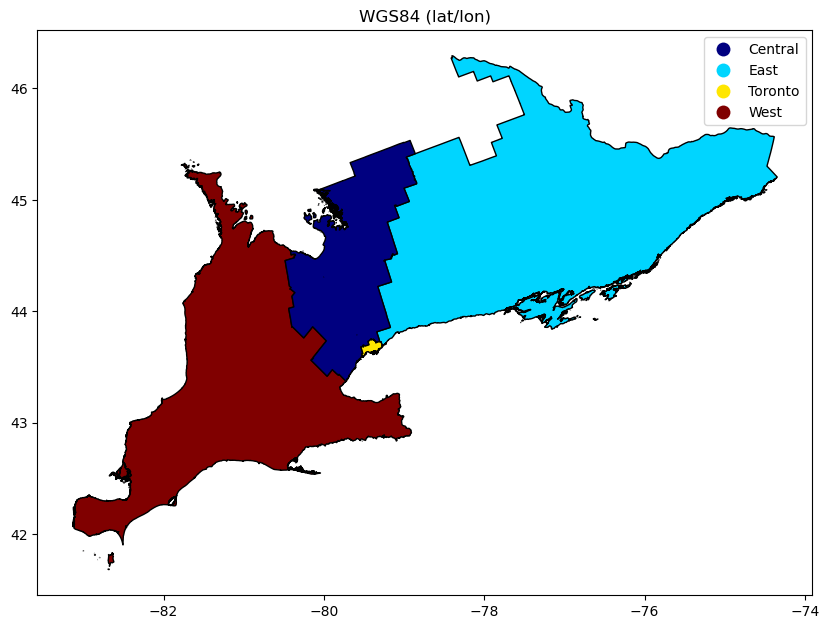

In [101]:
ontario = ontario.to_crs('EPSG:4326')
ontario = ontario[(ontario.REGION != "North")] # exclude Northern Ontario
ax=ontario.plot(cmap='jet', edgecolor='black', column='REGION', figsize=(10,10), legend=True)
ax.set_title('WGS84 (lat/lon)')

## contextily

In [102]:
# !pip install contextily

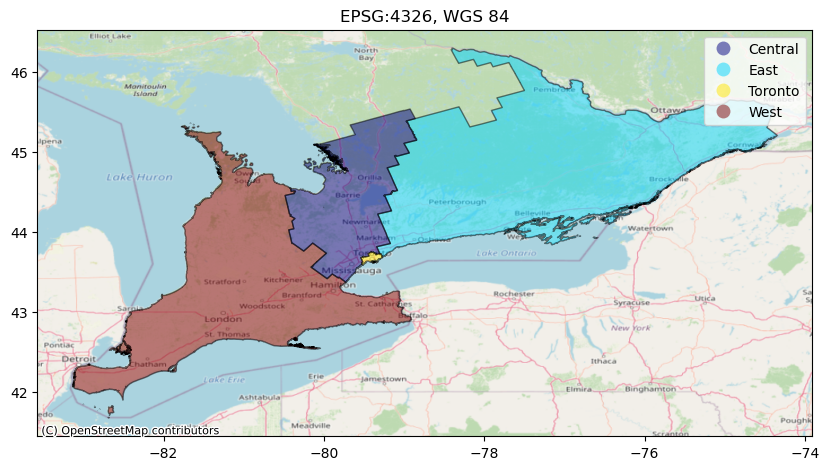

In [103]:
import contextily as ctx

ax=ontario.plot(cmap='jet', edgecolor='black', column='REGION', alpha=0.5, legend=True, figsize=(10,10))
ax.set_title("EPSG:4326, WGS 84")
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ontario.crs.to_string())

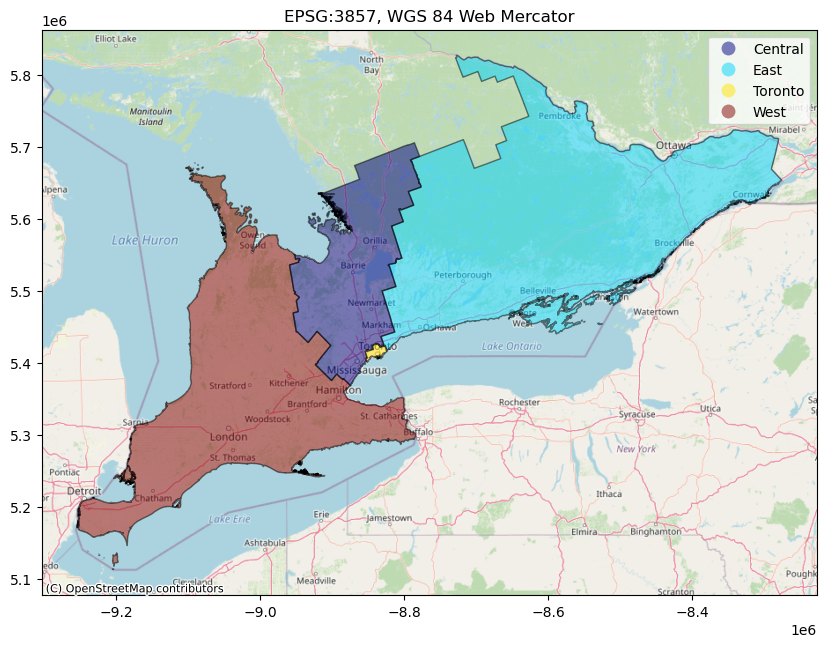

In [104]:
ontario = ontario.to_crs(epsg=3857) 
ax2=ontario.plot(cmap='jet', edgecolor='black', column='REGION', alpha=0.5, legend=True, figsize=(10,10))
ax2.set_title("EPSG:3857, WGS 84 Web Mercator")
ctx.add_basemap(ax2, source=ctx.providers.OpenStreetMap.Mapnik)

***
## Geospatial Data Visualization 

There are <b>many</b> libraries for visualization, but we are mainly using [folium](https://python-visualization.github.io/folium/) and [ipyleaflet](https://ipyleaflet.readthedocs.io/en/latest/). Both of them are just wrappers around [leaflet.js](https://github.com/Leaflet/Leaflet), which is the go-to library for any kind of map visualization in almost all web and mobile applications.

Both of `ipyleaflet` and `folium` were created to serve the same purpose, and you don't need to dwell so much on how to use them if you don't want to, as we have provided wrappers around them in  `utilities/utils/viz.py`. This contains two functions: one for drawing a map with our graph overlaid on it, and and the other function is for drawing a route between two places/nodes with markers marking the source and destination. At the very least, you should be able to recognize the differences between the two wrappers. `folium` is much more lightweight than `ipyleaflet`, but on the other hand `ipyleaflet` has more options and very niche capabitilies. `ipyleaflet` doesn't work on Google Colab, unlike `folium`; see [googlecolab/colabtools#60](https://github.com/googlecolab/colabtools/issues/60) for more details. 

There are other visualization libraries that you should be aware of: 

* [hvplot](https://hvplot.holoviz.org/user_guide/Geographic_Data.html), if you want to get going through your analysis with geopandas and dataframes and all that. You should be aware of the significance of working with vanilla [GeoPandas](https://geopandas.org/), and that `osmnx` [supports that](https://osmnx.readthedocs.io/en/stable/osmnx.html#module-osmnx.projection) and yields two dataframes: one for all your nodes and one for all the edges.

* [mplleaflet](https://github.com/jwass/mplleaflet), which is another `leaflet`-based library, but it plays really nicely with `matplotlib`.

* [deck.gl](https://deck.gl/)

* [kepler.gl](https://kepler.gl/)

* [Google Data Studio](https://datastudio.google.com/)


## Visualization using folium

In [105]:
# !pip install folium

In [106]:
import geopandas as gpd
import folium

ontario = ontario.to_crs(epsg=4326)

# Set starting location, initial zoom, and base layer source.
m = folium.Map(location=[43.67621,-79.40530],zoom_start=7, tiles='cartodbpositron', scrollWheelZoom=False, dragging=True)

for index, row in ontario.iterrows():
    # Simplify each region's polygon as intricate details are unnecessary
    sim_geo = gpd.GeoSeries(row['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, name=row['REGION'],style_function=lambda x: {'fillColor': 'black'})
    folium.Popup(row['REGION']).add_to(geo_j)
    geo_j.add_to(m)

m

## Visualization types in folium

In [107]:
import geopandas as gpd
import pandas

# Import polygons for Canadian provinces and concatenate to traffic statistics
# Define the raw URL
url_1 = "https://raw.githubusercontent.com/Optimization-Algorithms-Book/Code-Listings/05766c64c5e83dcd6788cc4415b462e2f82e0ccf/Appendix%20B/data/CanadaTraffic/canada.geojson"
url_2 = "https://raw.githubusercontent.com/Optimization-Algorithms-Book/Code-Listings/05766c64c5e83dcd6788cc4415b462e2f82e0ccf/Appendix%20B/data/CanadaTraffic/Canada_traffic.csv"

# Read the GeoJSON into a GeoDataFrame
canada = gpd.read_file(url_1)
traffic_accidents = pandas.read_csv(url_2)

dataset = pandas.concat([canada,traffic_accidents],axis=1).reindex(canada.index)
dataset =dataset.drop(columns=['Province','created_at','updated_at'])

In [108]:
dataset.head(5)

,name,cartodb_id,geometry,"Fatalities per 100,000 population","Injuries per 100,000 population",Fatalities per Billion vehicles-kilometres,Injuries per Billion vehicles-kilometres,"Fatalities per 100,000 licensed drivers","Injuries per 100,000 licensed drivers"
0,Quebec,1,"MULTIPOLYGON (((-78.01917 62.59193, -77.86722 ...",4.3,418.9,4.5,444.1,6.4,622.1
1,Newfoundland and Labrador,5,"MULTIPOLYGON (((-55.88306 53.48638, -55.72944 ...",7.4,517.0,7.2,498.9,6.6,460.8
2,British Columbia,6,"MULTIPOLYGON (((-131.07710 52.15009, -130.9481...",5.6,393.4,6.9,477.5,8.0,555.7
3,Nunavut,12,"MULTIPOLYGON (((-109.97841 78.67106, -109.4053...",5.2,65.1,48.8,609.8,74.2,928
4,Northwest Territories,13,"MULTIPOLYGON (((-110.39440 78.75221, -109.9784...",4.5,224.5,4.7,235.8,7.6,382.5


## Chloropleth Map
There are various ways to visualize geospatial data on a map. Below are a few examples of some common visualization types.

For the example in this section, data will be sourced from <a href="https://tc.canada.ca/en/road-transportation/statistics-data/canadian-motor-vehicle-traffic-collision-statistics-2018" target="new"> Statistics Canada’s dataset for Motor Vehicle Collisions in 2018</a>.

In [109]:
m = folium.Map(location=[58.4052172,-109.6062729],zoom_start=3, scrollWheelZoom=False, dragging=True)

# Setup binning for legend
bins = list(dataset['Injuries per 100,000 population'].quantile([0,0.25,0.5,0.75,1]))

# Main map init
folium.Choropleth(
    geo_data=dataset,
    name='chloropleth',
    data=dataset,
    columns=['name','Injuries per 100,000 population'],
    key_on='feature.properties.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Injuries per 100,000 population',
    bins=bins,
    reset=True
).add_to(m)
folium.LayerControl().add_to(m)

# Tooltip styling
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# Tooltip
NIL = folium.features.GeoJson(
    dataset,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name','Fatalities per 100,000 population','Injuries per 100,000 population','Fatalities per Billion vehicles-kilometres','Injuries per Billion vehicles-kilometres','Fatalities per 100,000 licensed drivers','Injuries per 100,000 licensed drivers'],
        aliases=['Province','Fatalities per 100,000 population','Injuries per 100,000 population','Fatalities per Billion vehicles-kilometres','Injuries per Billion vehicles-kilometres','Fatalities per 100,000 licensed drivers','Injuries per 100,000 licensed drivers'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
m.add_child(NIL)
m.keep_in_front(NIL)
m

## Cartogram Map
Cartogram maps distort the area or distance scale of a map to reflect a chosen variable. In this case, we can distort the area of each individual province to scale to its share of motor vehicle injuries in 2018.

In [110]:
# !pip install geoplot

<GeoAxes: >

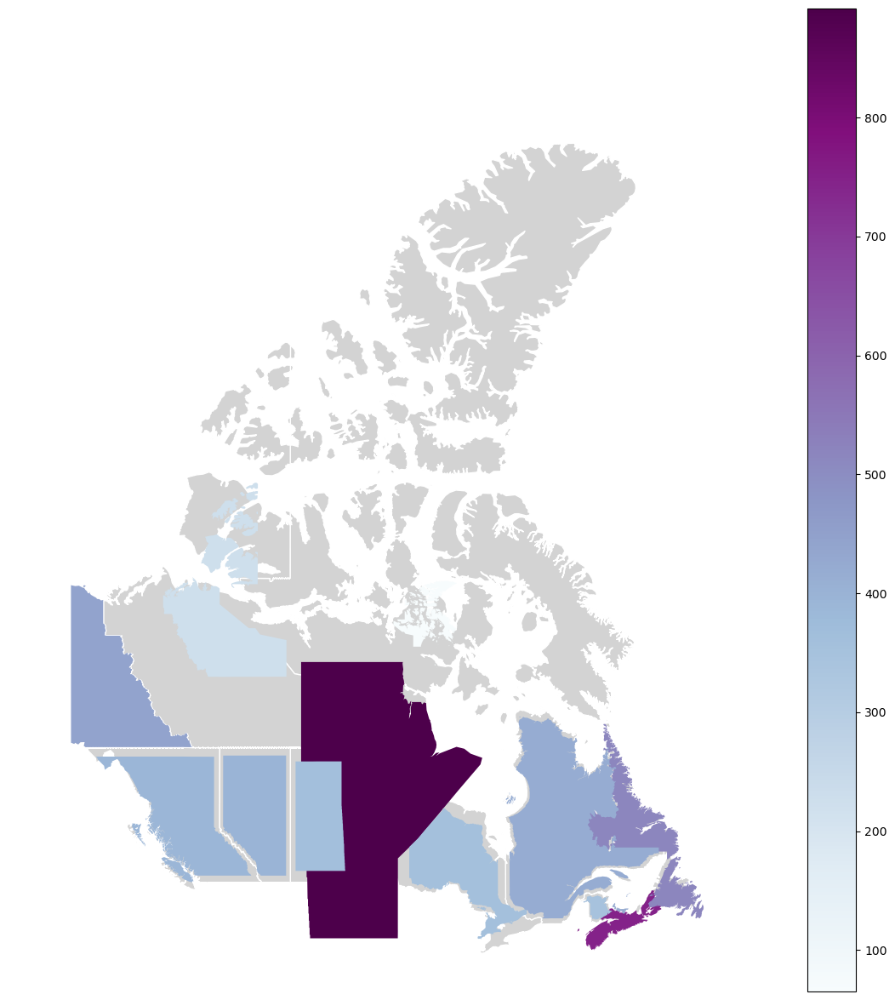

In [111]:
import geoplot


ax = geoplot.cartogram(
    dataset,
    scale='Injuries per 100,000 population', 
    legend=True,
    hue='Injuries per 100,000 population',
    legend_var='hue',
    cmap='BuPu',
    limits=(0.15,2),
    projection=geoplot.crs.WebMercator(),
    figsize=(15,15))
geoplot.polyplot(dataset, facecolor='lightgray', edgecolor='white', ax=ax)

In this cartogram map, we can see that Manitoba has a disproportionate share of the motor vehicle injuries.

## Bubble Map
Bubble maps show properties of the points being visualized through colour and size variations. In the example below, we vary Marker size by the Injuries per 100,000 population, while we colour provinces in blue and territories in red.

In [112]:
territories = ['Yukon Territory','Nunavut','Northwest Territories']

m = folium.Map(location=[58.4052172,-109.6062729],zoom_start=3, scrollWheelZoom=False, dragging=True)

for i,r in dataset.iterrows():
    folium.Circle(
        location=[r['geometry'].centroid.y,r['geometry'].centroid.x],
        radius = float(r['Injuries per 100,000 population'])*500,
        fill=True,
        popup=f"{r['name']}: {r['Injuries per 100,000 population']}",
        color = 'blue' if r['name'] not in territories else 'crimson'
        ).add_to(m)
m

## Hexagonal Binning

Hexagonal binning is a kind of aggregate visualization method where hexagons are drawn over the map, with each hexagon summarizing/abstracting the data that it contains.

The example below uses traffic accident data for Toronto, retrieved from the [Toronto Police Service’s Public Safety Data Portal](https://data.torontopolice.on.ca/pages/ksi). 

In [113]:
# !pip install plotly

In [114]:
import plotly.figure_factory as ff

# Import polygons for Canadian provinces and concatenate to traffic statistics
# Define the raw URL
url = "https://raw.githubusercontent.com/Optimization-Algorithms-Book/Code-Listings/05766c64c5e83dcd6788cc4415b462e2f82e0ccf/Appendix%20B/data/Police/KSI.geojson"

# Read the GeoJSON into a GeoDataFrame
ksi = gpd.read_file(url)

fig = ff.create_hexbin_mapbox(
    data_frame=ksi,
    lat="LATITUDE",
    lon="LONGITUDE",
    nx_hexagon=15,
    opacity=0.5,
    min_count=1,
    labels={'color':'Reported Accidents'},
    color_continuous_scale='turbo'
    )

fig.update_layout(mapbox_style="open-street-map")
fig.show()

## Heat Map
Heat maps use a colour gradient to represent increasing density in data. As the underlying data points increases in density, so does the intensity (or shade) of the heatmap colour. Below is an example using the same Toronto traffic data from before.

In [115]:
import plotly.express as px

fig = px.density_mapbox(
    data_frame=ksi,
    lat="LATITUDE", 
    lon="LONGITUDE",
    mapbox_style='open-street-map',
    radius=1,
    zoom=9,
)
fig.update_layout(coloraxis_showscale=False, hovermode=False)

## Cluster Map
Cluster maps aggregate data by merging neighouring points into one larger “cluster”. This generally improves performance when rendering larger datasets, and provides an easy-to-access indicator of density.

In [116]:
from folium.plugins import FastMarkerCluster
m = folium.Map(location=[43.6532,-79.3832], zoom_start=10, scrollWheelZoom=False, dragging=True)
FastMarkerCluster([[r.LATITUDE,r.LONGITUDE] for r in ksi.itertuples()]).add_to(m)

m

## Interactive mapping with leafmap

In [117]:
# !pip install leafmap

In [118]:
import leafmap

m = leafmap.Map(center=[43.6532, -79.3832], zoom=8)  # City of Toronto as the center of the map
m

Map(center=[43.6532, -79.3832], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

***
# Graph Analysis: UofT as a case study

In [119]:
import numpy as np
import pandas as pd
import random
import osmnx as ox
import networkx as nx
from networkx.algorithms import isomorphism
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import folium
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Graph of an area of interest

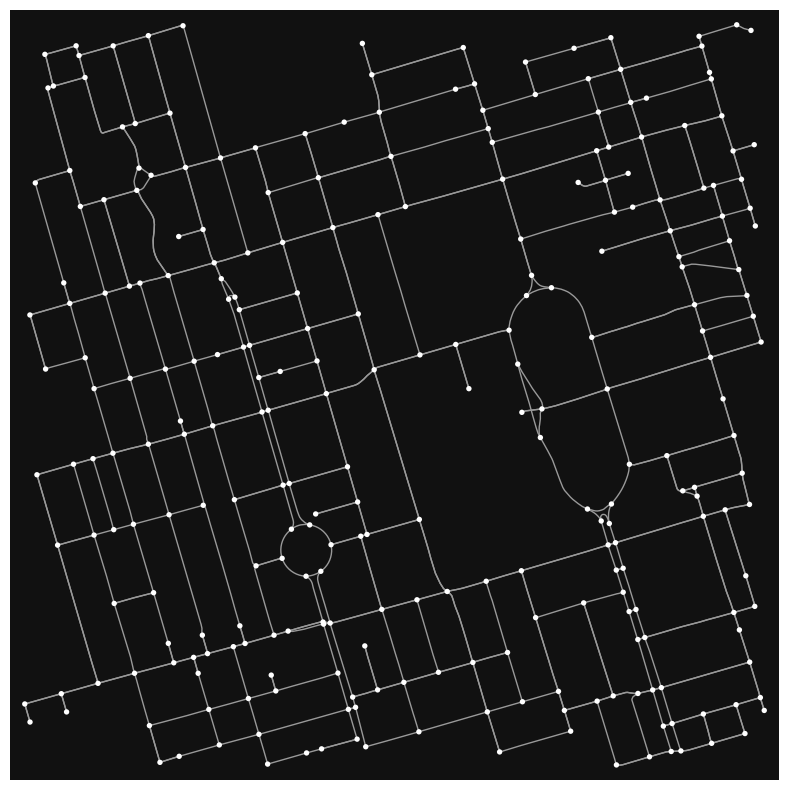

In [120]:
# Define the geographic area of interest
place_name = "University of Toronto, Toronto, Canada" # "Financial District, Toronto, Canada" # "Times Square, NY"

# networkx graph of the named place
graph = ox.graph_from_address(place_name, network_type='drive')

# Plot the network
fig, ax = ox.plot_graph(graph, figsize=(10, 10))

plt.show()

### Highlight all one-way edges in the road network

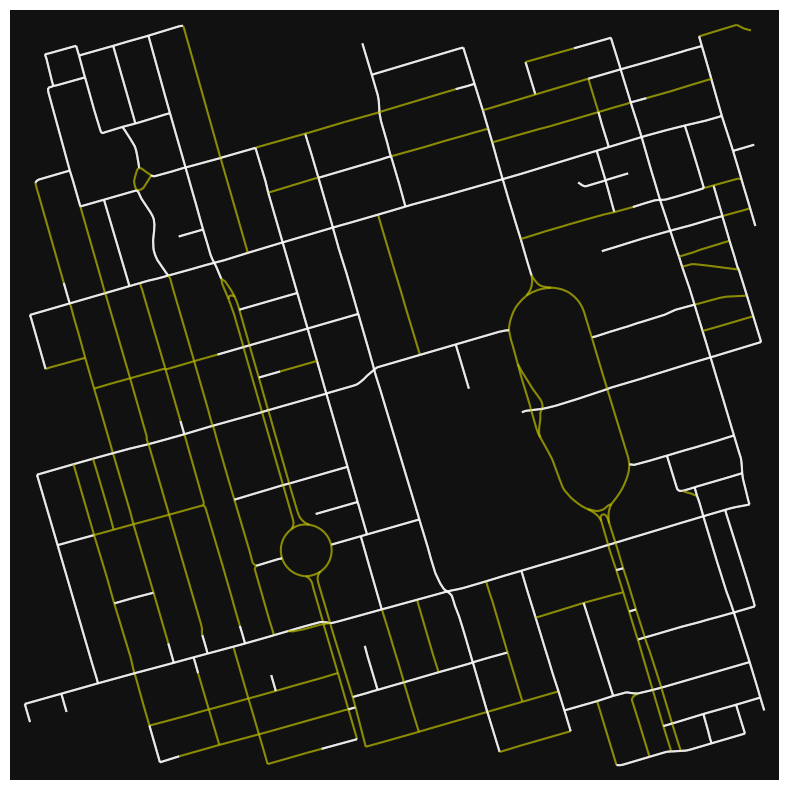

In [121]:
ec = ['y' if data['oneway'] else 'w' for u, v, key, data in graph.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(graph, figsize=(10,10), node_size=0, edge_color=ec, edge_linewidth=1.5, edge_alpha=0.7)

### Extract the nodes and the edges of the graph

In [122]:
nodes, edges = ox.graph_to_gdfs(graph)

#print first 5 nodes
nodes.head(5)

,y,x,highway,street_count,geometry
osmid,,,,,
20964462,43.670240,-79.386776,traffic_signals,4,POINT (-79.38678 43.67024)
20964579,43.667527,-79.399825,traffic_signals,4,POINT (-79.39983 43.66753)
20964581,43.669724,-79.389469,traffic_signals,4,POINT (-79.38947 43.66972)
20979740,43.666067,-79.392493,NaN,3,POINT (-79.39249 43.66607)
20979742,43.666368,-79.393159,NaN,3,POINT (-79.39316 43.66637)


In [123]:
#print first 5 edges
edges.head(5)

osmid  oneway   lanes  \
u        v        key                                            
20964462 59239242 0                   30326665   False       2   
         34494559 0                  446841731   False       4   
         34404557 0    [234733018, 1290819150]   False       2   
20964579 34710020 0      [5090496, 1172636855]   False  [3, 2]   
         24959546 0      [1172636856, 4212261]   False  [3, 2]   

                                    name      highway maxspeed reversed  \
u        v        key                                                     
20964462 59239242 0         Yonge Street      primary       40    False   
         34494559 0         Yonge Street      primary       40     True   
         34404557 0    Bloor Street West      primary       40     True   
20964579 34710020 0     St George Street  residential       40    False   
         24959546 0     St George Street     tertiary       30    False   

                        length  \
u        v        key            
20964462 59239242 0    103.506   
         34494559 0     99.556   
         34404557 0    103.508   
20964579 34710020 0    140.280   
         24959546 0    242.862   

                                                                geometry  \
u        v        key                                                      
20964462 59239242 0    LINESTRING (-79.38678 43.67024, -79.38681 43.6...   
         34494559 0    LINESTRING (-79.38678 43.67024, -79.38675 43.6...   
         34404557 0    LINESTRING (-79.38678 43.67024, -79.38689 43.6...   
20964579 34710020 0    LINESTRING (-79.39983 43.66753, -79.39986 43.6...   
         24959546 0    LINESTRING (-79.39983 43.66753, -79.39979 43.6...   

                      access junction width bridge  
u        v        key                               
20964462 59239242 0      NaN      NaN   NaN    NaN  
         34494559 0      NaN      NaN   NaN    NaN  
         34404557 0      NaN      NaN   NaN    NaN  
20964579 34710020 0      NaN      NaN   NaN    NaN  
         24959546 0      NaN      NaN   NaN    NaN

In [124]:
# examine each individual node or edge.
list(graph.nodes(data=True))[1]

(20964579,
 {'y': 43.6675265,
  'x': -79.3998253,
  'highway': 'traffic_signals',
  'street_count': 4})

In [125]:
print(edges['highway'].value_counts())

highway
residential       297
secondary         163
tertiary           73
primary            50
unclassified       45
secondary_link     13
living_street       4
Name: count, dtype: int64


In [126]:
# more statistics
ox.basic_stats(graph)

{'n': 271,
 'm': 645,
 'k_avg': 4.760147601476015,
 'edge_length_total': np.float64(72976.07500000008),
 'edge_length_avg': np.float64(113.14120155038773),
 'streets_per_node_avg': 3.2287822878228782,
 'streets_per_node_counts': {0: 0, 1: 9, 2: 17, 3: 149, 4: 95, 5: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.033210332103321034,
  2: 0.06273062730627306,
  3: 0.5498154981549815,
  4: 0.3505535055350554,
  5: 0.0036900369003690036},
 'intersection_count': 262,
 'street_length_total': np.float64(46917.837000000014),
 'street_segment_count': 401,
 'street_length_avg': np.float64(117.00208728179554),
 'circuity_avg': np.float64(1.005335896664392),
 'self_loop_proportion': 0.0}

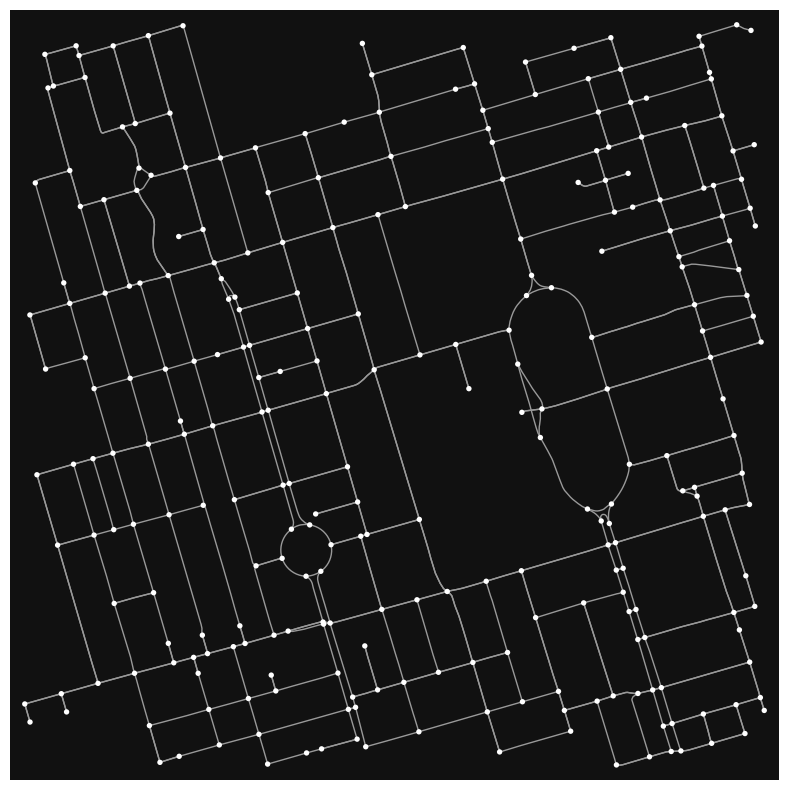

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [127]:
# GeoDataFrame to MultiDiGraph
new_graph = ox.graph_from_gdfs(nodes,edges)
ox.plot_graph(new_graph,figsize=(10,10))

### Graph Statistics

In [128]:
# Convert MultiDiGraph to simple Graph for basic statistics
G = nx.Graph(graph)

# Print general information about the graph
print("Road Network Information:")
print(f"Place: {place_name}")
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
print(f"Graph density: {nx.density(G):.4f}")
print(f"Is the graph connected? {nx.is_connected(G)}")
print(f"Average node degree: {sum(dict(G.degree()).values()) / graph.number_of_nodes():.2f}")
print(f"Average clustering coefficient: {nx.average_clustering(G):.2f}")

# Compute additional statistics
if nx.is_connected(G):
    print(f"Diameter of the graph: {nx.diameter(G)}")
    print(f"Average shortest path length: {nx.average_shortest_path_length(G)}")

# Print basic information about the first few nodes and edges
print("\nNode information (first 10 nodes):")
for node in list(G.nodes)[:10]:
    print(f"Node {node}: Degree = {G.degree(node)}, Position = {G.nodes[node]}")

print("\nEdge information (first 10 edges):")
for edge in list(G.edges)[:10]:
    print(f"Edge {edge}: Weight = {G.edges[edge].get('length', 'N/A')}")

# If there are attributes associated with edges, print them
if len(G.edges) > 0 and 'length' in next(iter(G.edges.values())):
    lengths = [G.edges[edge].get('length', 'N/A') for edge in G.edges]
    print(f"Average edge length: {sum(lengths) / len(lengths) if lengths else 'N/A'}")
else:
    print("No edge length attribute found.")

Road Network Information:
Place: University of Toronto, Toronto, Canada
Number of nodes: 271
Number of edges: 401
Graph density: 0.0110
Is the graph connected? True
Average node degree: 2.96
Average clustering coefficient: 0.02
Diameter of the graph: 27
Average shortest path length: 10.683613502801695

Node information (first 10 nodes):
Node 20964462: Degree = 3, Position = {'y': 43.6702395, 'x': -79.3867761, 'highway': 'traffic_signals', 'street_count': 4}
Node 20964579: Degree = 4, Position = {'y': 43.6675265, 'x': -79.3998253, 'highway': 'traffic_signals', 'street_count': 4}
Node 20964581: Degree = 4, Position = {'y': 43.6697241, 'x': -79.3894689, 'highway': 'traffic_signals', 'street_count': 4}
Node 20979740: Degree = 3, Position = {'y': 43.6660672, 'x': -79.392493, 'street_count': 3}
Node 20979742: Degree = 3, Position = {'y': 43.6663676, 'x': -79.3931594, 'street_count': 3}
Node 20979743: Degree = 3, Position = {'y': 43.6658771, 'x': -79.3933295, 'street_count': 3}
Node 20979752:

## Plot the directed road network using NetworkX

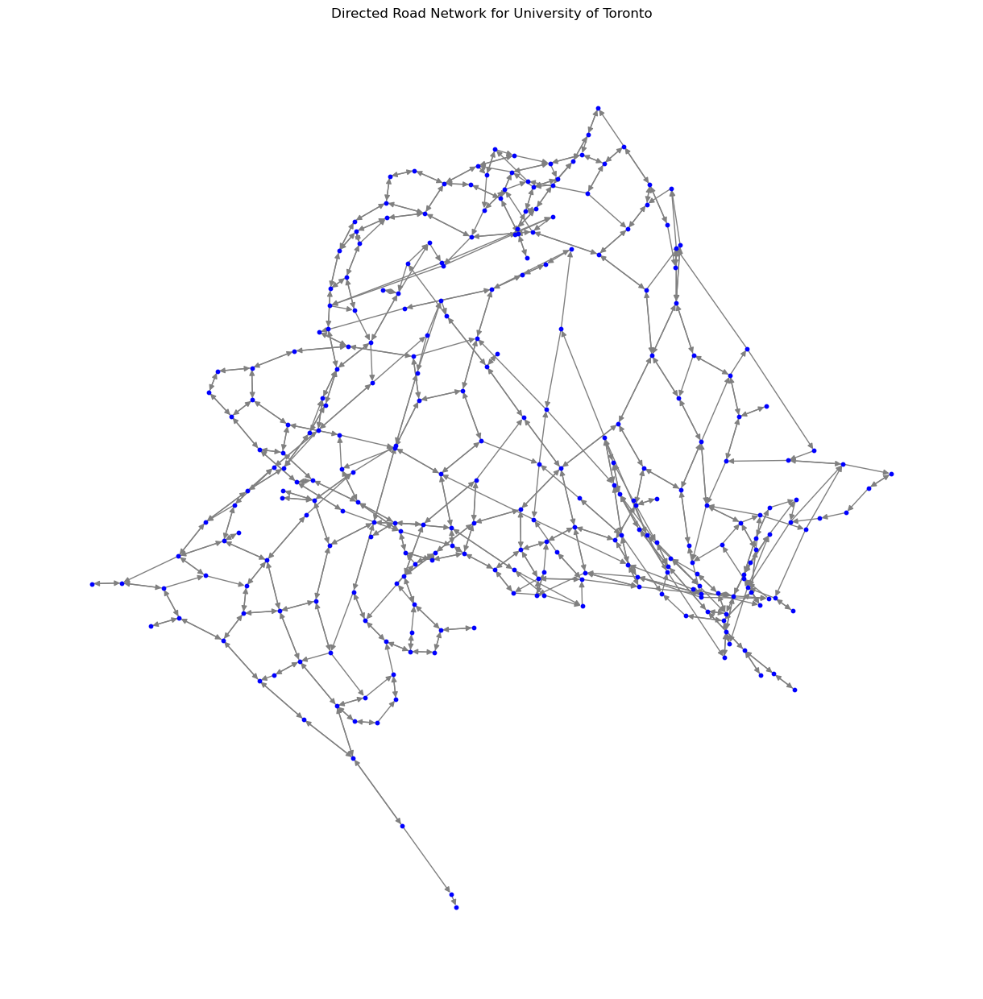

In [129]:
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(graph, seed=42)  # You can use other layouts if needed
nx.draw(graph, pos, node_size=10, node_color="blue", edge_color="gray", with_labels=False, arrows=True)
plt.title("Directed Road Network for University of Toronto")
plt.show()

### Helper function to plot graphs

In [130]:
def plot_graph(G, node_values=None, graph_title=None):
    """
    Function to plot network graph with nodes colored by their respective attributes.

    Parameters:
    - G: NetworkX graph
    - node_values: Dictionary of node values (e.g., centrality measures) to visualize
    - graph_title: Graph title being visualized (used for the color bar label)
    """

    # Create a color map for node coloring
    cmap = plt.get_cmap('viridis') # 'tab20'

    # Create the figure and axis
    fig, ax = plt.subplots(figsize=(12, 12))

    # Compute the layout for nodes positioning
    pos = nx.spring_layout(G, seed=42)  # Fixed seed for reproducibility

    # Draw the edges with a default color (gray)
    nx.draw_networkx_edges(G, pos, edge_color='gray', ax=ax)

    # Draw the nodes with optional node values
    if node_values and isinstance(node_values, dict):
        norm_nodes = mcolors.Normalize(vmin=min(node_values.values()), vmax=max(node_values.values()))
        node_colors = [cmap(norm_nodes(node_values.get(node, 0))) for node in G.nodes()]
        nodes = nx.draw_networkx_nodes(G, pos, node_size=50, node_color=node_colors, ax=ax)
        sm_nodes = plt.cm.ScalarMappable(cmap=cmap, norm=norm_nodes)
        sm_nodes.set_array([])  # Only needed for ScalarMappable
        # Add the color bar to the plot
        cbar_nodes = plt.colorbar(sm_nodes, ax=ax)
        cbar_nodes.set_label(graph_title)
    else:
        # Draw nodes with default color
        nx.draw_networkx_nodes(G, pos, node_size=50, node_color='gray', ax=ax)

    # Draw node labels (IDs)
    nx.draw_networkx_labels(G, pos, labels={node: node for node in G.nodes()}, font_size=8, font_color='black', ax=ax)

    # Set the graph title
    plt.title(f"Graph with {graph_title}")
    plt.show()

## Node-based features

In [131]:
# Print attributes associated with individual nodes
print("Node Attributes:")
for node, data in graph.nodes(data=True):
    print(f"Node {node}: {data}")

Node Attributes:
Node 20964462: {'y': 43.6702395, 'x': -79.3867761, 'highway': 'traffic_signals', 'street_count': 4}
Node 20964579: {'y': 43.6675265, 'x': -79.3998253, 'highway': 'traffic_signals', 'street_count': 4}
Node 20964581: {'y': 43.6697241, 'x': -79.3894689, 'highway': 'traffic_signals', 'street_count': 4}
Node 20979740: {'y': 43.6660672, 'x': -79.392493, 'street_count': 3}
Node 20979742: {'y': 43.6663676, 'x': -79.3931594, 'street_count': 3}
Node 20979743: {'y': 43.6658771, 'x': -79.3933295, 'street_count': 3}
Node 20979752: {'y': 43.6606966, 'x': -79.3912843, 'street_count': 3}
Node 20979753: {'y': 43.6608186, 'x': -79.3904803, 'street_count': 3}
Node 20979755: {'y': 43.6617827, 'x': -79.3898782, 'street_count': 3}
Node 20979758: {'y': 43.6672491, 'x': -79.3935234, 'street_count': 3}
Node 20979760: {'y': 43.6575299, 'x': -79.3895942, 'highway': 'traffic_signals', 'street_count': 3}
Node 20979761: {'y': 43.657579, 'x': -79.3893605, 'highway': 'traffic_signals', 'street_count'

## Node degree

The node degree is the number of edges connected to a given node. In the context of a road network, it tells us how many roads or paths meet at a particular intersection.
* A degree of 1: represents a dead-end or cul-de-sac, where the intersection (node) is connected to the rest of the network by just one road (edge).
* A degree of 2: represents a straight road segment where the node (intersection) connects two roads.
* A degree of 3: represents a T-junction where three roads meet.
* A degree of 4 or more: represents a crossroads where multiple roads converge.

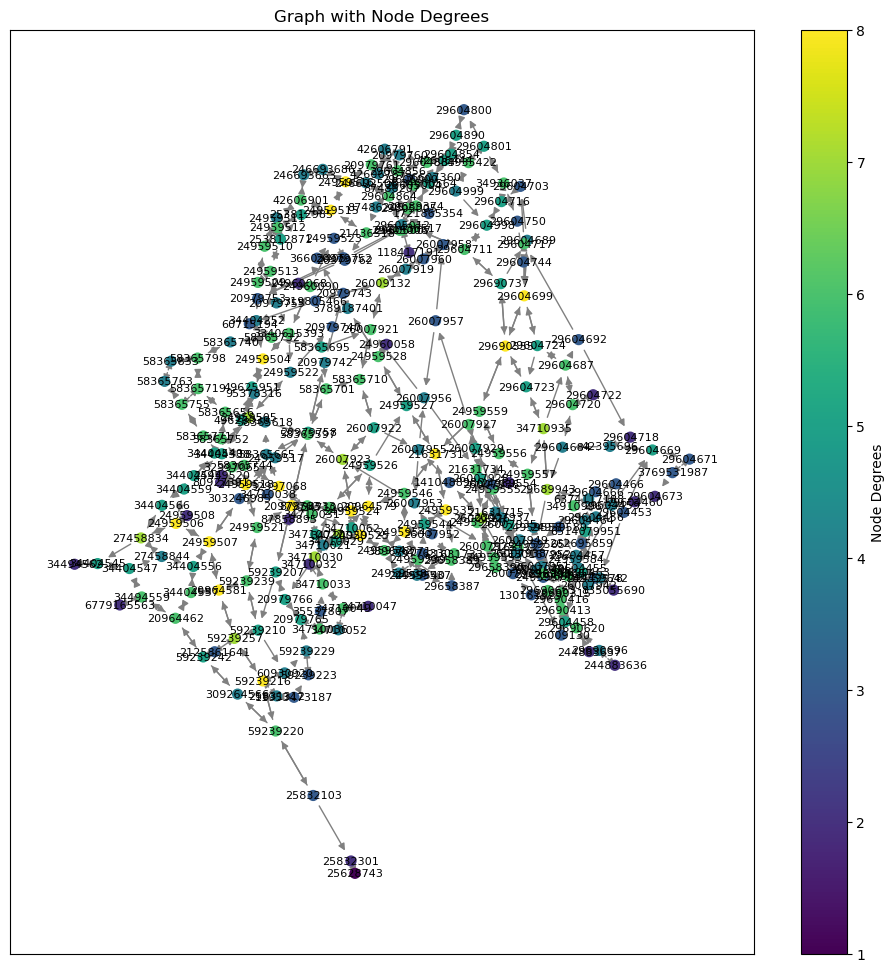

In [132]:
# Compute node degrees
node_degrees = dict(graph.degree())

# Plot the graph
plot_graph(graph, node_degrees, 'Node Degrees')

## Node degree centrality

Node degree centrality measures the importance of a node in a network based on its number of connections. 

For a node $𝑣$, degree centrality $𝐶_D(v)$ is calculated as:

 $𝐶_D(v)=\dfrac{degree(v)}{n-1}$

where:
* $degree(𝑣)$ is the number of edges connected to node $v$ (i.e., its degree)
* $𝑛$ is the total number of nodes in the network.

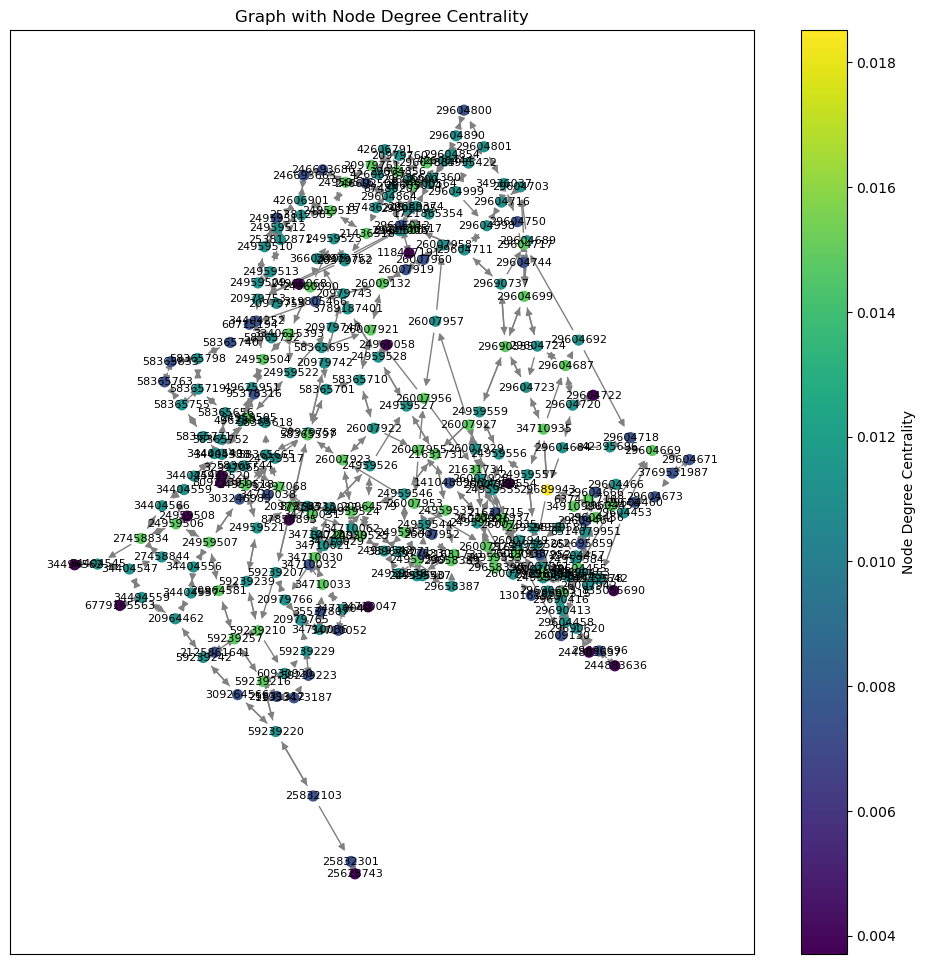

In [133]:
# Compute node degree centrality
node_degree_centrality = nx.degree_centrality(G)

# Plot the graph
plot_graph(graph, node_degree_centrality, 'Node Degree Centrality')

## Eigenvector centrality 

Eigenvector centrality measures the influence of a node in a network. It assigns relative scores to all nodes, considering that connections to high-scoring nodes contribute more than equal connections to low-scoring nodes. Nodes (intersections) with high eigenvector centrality are not only connected to many other nodes but are connected to highly important or central nodes. Example: a major intersection that is directly connected to other important intersections, such as one connecting multiple downtown campus roads, would have high eigenvector centrality.

Eigenvector centrality for a node $𝑣$ is defined as the $𝑣$-th component of the eigenvector corresponding to the largest eigenvalue of the graph's adjacency matrix. This can be computed iteratively:

$C_E(v)=\dfrac{1}{\lambda} \sum_{u\in N(v)} C_E(u)$

Where:
* $𝐶_𝐸(𝑣)$ is the eigenvector centrality of node,
* $\lambda$ is the eigenvalue,
* $𝑁(𝑣)$ is the set of neighbors of $𝑣$,
* $ C_E(u)$ is the centrality score of neighbor $𝑢$.

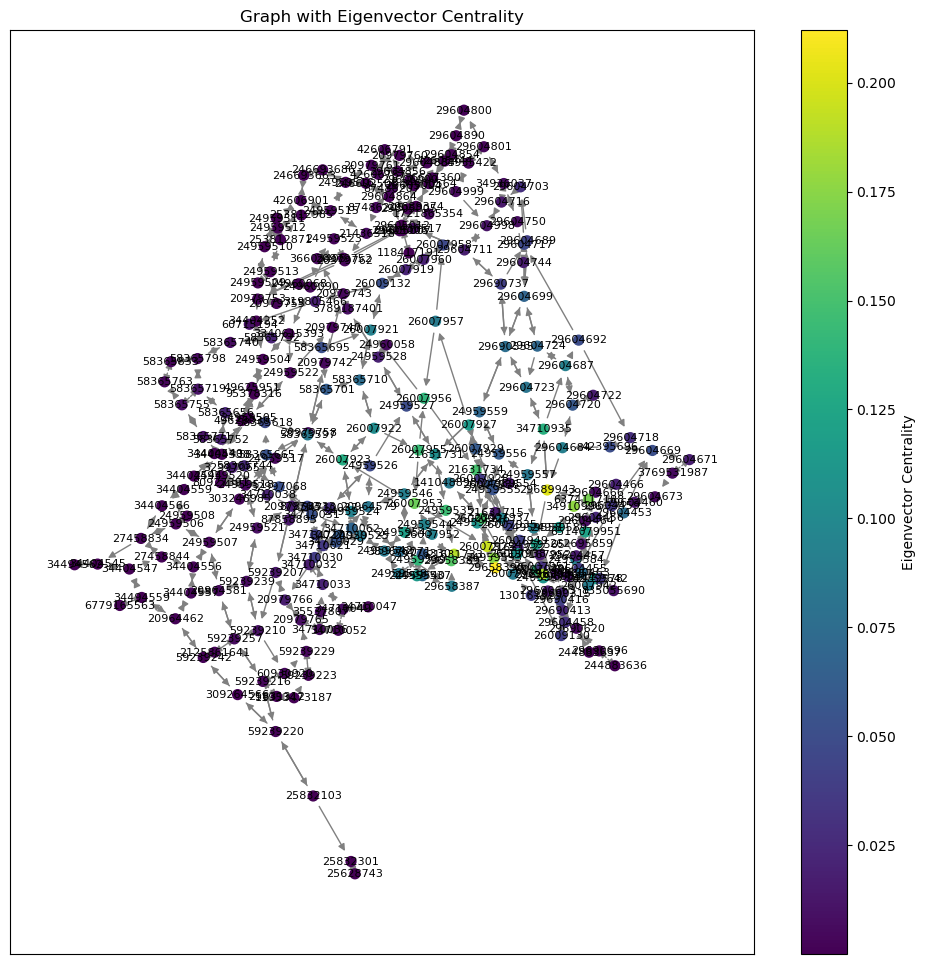

In [134]:
# Compute eigenvector centrality
node_eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=500)

# Plot the graph
plot_graph(graph, node_eigenvector_centrality, 'Eigenvector Centrality')

## Betweenness Centrality

Betweenness Centrality is a measure of how often a node (an intersection or junction) lies on the shortest paths between other nodes in the network. If a node is frequently on the shortest path between other nodes, it has high betweenness centrality.

For a node $𝑣$, betweenness centrality $C_B(v) is defined as:

$C_B(v)=\sum_{s,t\in V, s \neq t} \dfrac{\sigma_{st}(v)}{\sigma_{st}} $

Where:
* $\sigma_{st}$ is the total number of shortest paths from node $s$ to node $t$,
* $\sigma_{st}(v)$ is the number of those paths that pass through node $v$,
* $V$ is the set of all nodes in the graph,
* If $s=t$, $\sigma_{st}=1$,

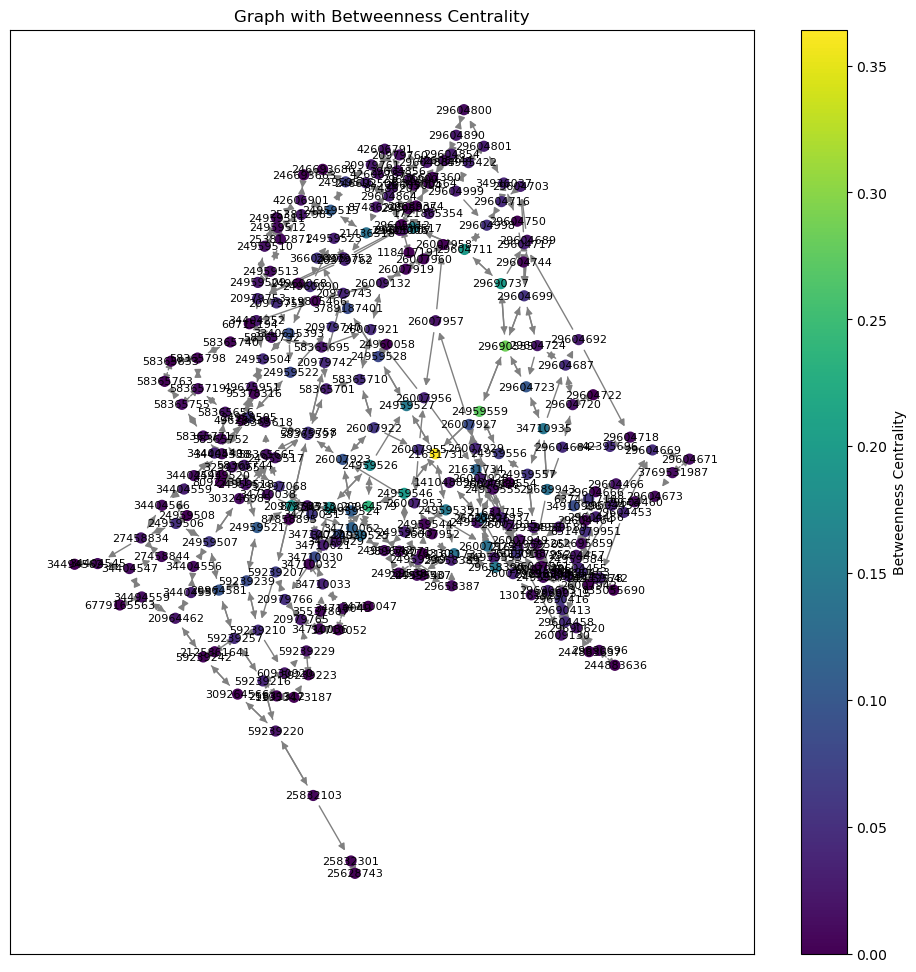

In [135]:
# Compute betweenness centrality
node_betweenness_centrality = nx.betweenness_centrality(graph)

# Plot the graph
plot_graph(graph, node_betweenness_centrality, 'Betweenness Centrality')

## Load centrality

The load centrality of a node is the fraction of all shortest paths that pass through that node.

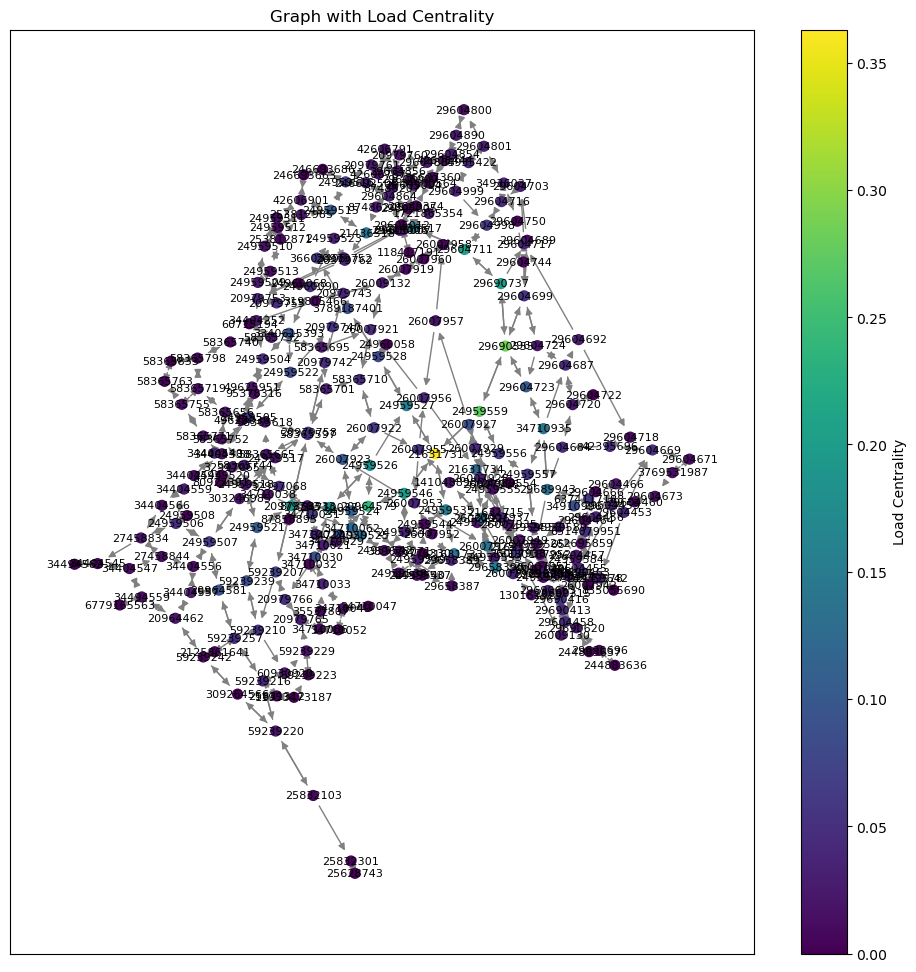

In [136]:
# Compute load centrality
node_load_centrality = nx.load_centrality(graph)

# Plot the graph
plot_graph(graph, node_load_centrality, 'Load Centrality')

## Closeness Centrality

Closeness Centrality measures how easily a node (intersection or junction) can reach all other nodes in the network. It represents how "close" or "accessible" a particular intersection is to the rest of the road network, based on the shortest paths.

For a node $𝑣$, closeness centrality $C_C(v) is defined as:

$C_C(v)=  \dfrac{n-1}{\sum_{u \neq v}d(v,u)} $

Where:
* $n$  is the total number of nodes in the graph,
* $d(v,u)$  is the shortest path distance between nodes $𝑣$ and $𝑢$.

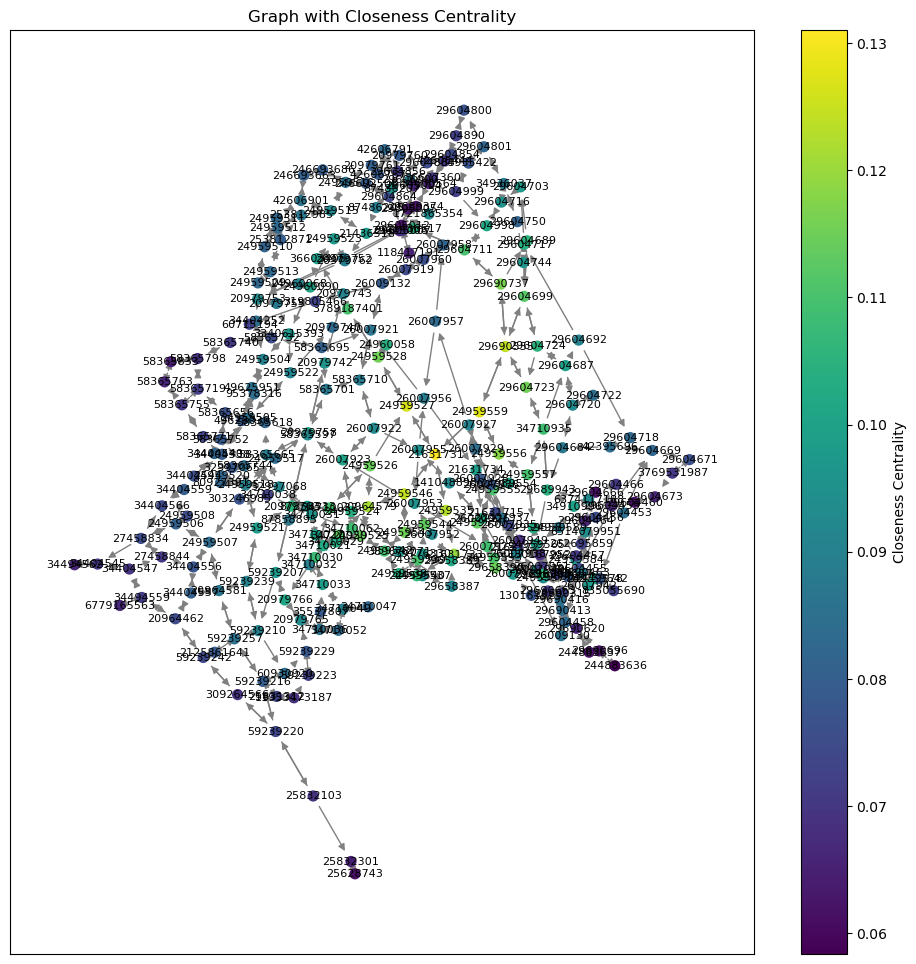

In [137]:
# Compute closeness centrality
node_closeness_centrality = nx.closeness_centrality(graph)

# Plot the graph
plot_graph(graph, node_closeness_centrality, 'Closeness Centrality')

## Clustering coefficient

 Clustering Coefficient measures the extent to which noes (intersections) in the road network tend to form triangles, or tightly connected groups, with their neighboring intersections. It helps assess the "local connectivity" of an intersection based on how well its neighboring intersections are connected to each other.

For a node $𝑣$, clustering coefficientt $C(v) is defined as:

$C(v)=  \dfrac{2 \times N_v}{N_T} $

Where:
* $N_v$ is the the number of edges (roads) actually exist between the neighbors of the node $v$,
* $N_T$  is the total number of possible edges that could exist between the neighbors of the node $v$.

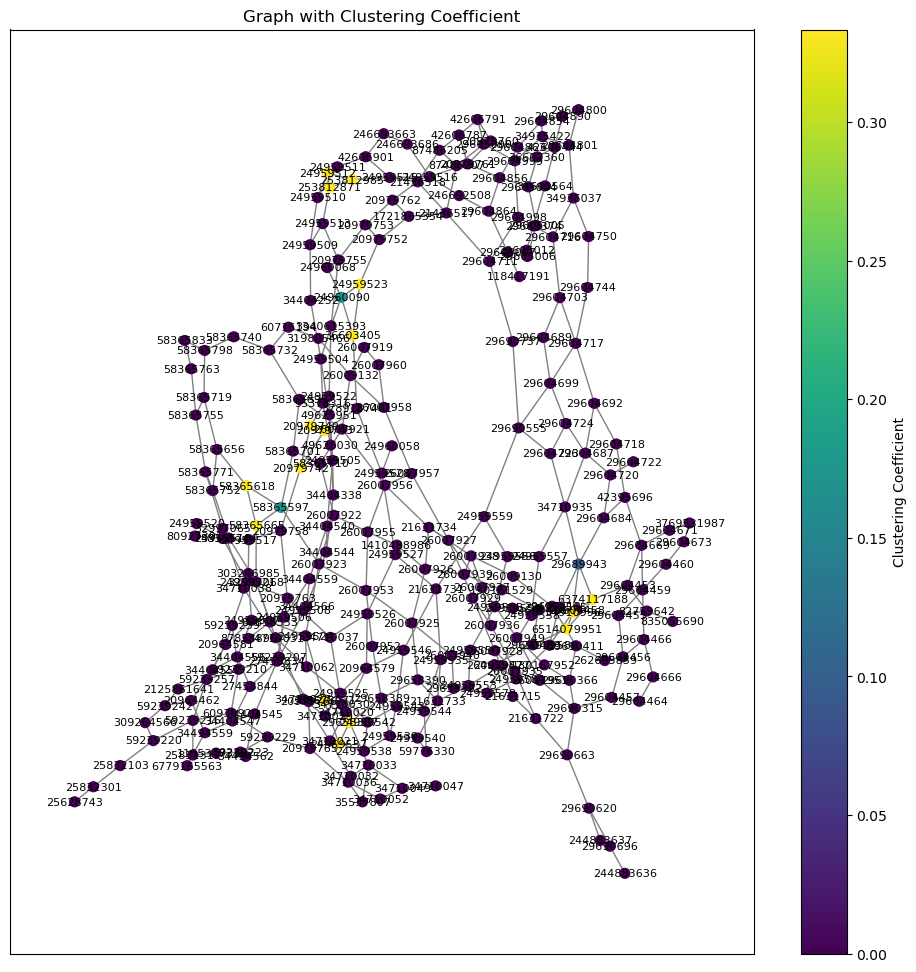

In [138]:
# Compute clustering coefficient
node_clustering = nx.clustering(G) # use undirected graph

# Plot the graph
plot_graph(G, node_clustering, 'Clustering Coefficient')

## Compare Centrality Values

In [139]:
data = [node_degree_centrality, node_eigenvector_centrality, node_betweenness_centrality, node_closeness_centrality]
indices = ['Degree Centrality', 'Eigenvector Centrality', 'Betweenness Centrality', 'Closeness Centrality']
df = pd.DataFrame(data, index=indices).T
cmap = plt.get_cmap('viridis')
df.style.background_gradient(cmap=cmap)

,Degree Centrality,Eigenvector Centrality,Betweenness Centrality,Closeness Centrality
20964462,0.011111,0.001309,0.021987,0.074976
20964579,0.014815,0.083146,0.235358,0.121357
20964581,0.014815,0.005372,0.097384,0.086933
20979740,0.011111,0.003258,0.052191,0.083521
20979742,0.011111,0.004464,0.043701,0.096347
20979743,0.011111,0.004571,0.038732,0.090266
20979752,0.011111,0.003137,0.033206,0.088613
20979753,0.011111,0.002653,0.040772,0.093306
20979755,0.011111,0.001792,0.048256,0.087736
20979758,0.011111,0.007437,0.059053,0.100840


### Print the nodes with maximum centrality values for each measure

In [140]:
max_centralities = df.idxmax()
print("Nodes with maximum centrality values:")
for centrality, node in max_centralities.items():
    print(f"{centrality}: Node {node} with value {df.loc[node, centrality]:.4f}")

Nodes with maximum centrality values:
Degree Centrality: Node 29689943 with value 0.0185
Eigenvector Centrality: Node 29658390 with value 0.2121
Betweenness Centrality: Node 21631731 with value 0.3642
Closeness Centrality: Node 21631731 with value 0.1310


In [141]:
# Identify nodes with maximum centrality values
max_node_degree = max(node_degree_centrality, key=node_degree_centrality.get)
max_node_eigenvector = max(node_eigenvector_centrality, key=node_eigenvector_centrality.get)
max_node_betweenness = max(node_betweenness_centrality, key=node_betweenness_centrality.get)
max_node_closeness = max(node_closeness_centrality, key=node_closeness_centrality.get)

# Retrieve node coordinates (GPS) using NetworkX's built-in method
longitudes = nx.get_node_attributes(G, 'x')
latitudes = nx.get_node_attributes(G, 'y')

# Combine longitudes and latitudes into a DataFrame
node_coords_df = pd.DataFrame({
    'Longitude': longitudes,
    'Latitude': latitudes
})

# Print GPS coordinates for nodes with maximum centrality values
print("GPS Coordinates of Nodes with Maximum Centrality Values:")
print(f"Node with Maximum Degree Centrality ({max_node_degree}): {node_coords_df.loc[max_node_degree].values}")
print(f"Node with Maximum Eigenvector Centrality ({max_node_eigenvector}): {node_coords_df.loc[max_node_eigenvector].values}")
print(f"Node with Maximum Betweenness Centrality ({max_node_betweenness}): {node_coords_df.loc[max_node_betweenness].values}")
print(f"Node with Maximum Closeness Centrality ({max_node_closeness}): {node_coords_df.loc[max_node_closeness].values}")

GPS Coordinates of Nodes with Maximum Centrality Values:
Node with Maximum Degree Centrality (29689943): [-79.3999158  43.65793  ]
Node with Maximum Eigenvector Centrality (29658390): [-79.4022028  43.6630513]
Node with Maximum Betweenness Centrality (21631731): [-79.3984403  43.6640762]
Node with Maximum Closeness Centrality (21631731): [-79.3984403  43.6640762]


### Visualization using folium

In [142]:
# Combine longitudes and latitudes into a DataFrame
node_coords_df = pd.DataFrame({
    'Longitude': longitudes,
    'Latitude': latitudes
})

# Prepare data for visualization
nodes_to_visualize = {
    'Degree Centrality': max_node_degree,
    'Eigenvector Centrality': max_node_eigenvector,
    'Betweenness Centrality': max_node_betweenness,
    'Closeness Centrality': max_node_closeness
}

# Create a Folium map centered around the average location of the nodes
avg_lat = node_coords_df['Latitude'].mean()
avg_lon = node_coords_df['Longitude'].mean()
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=16) #  scrollWheelZoom=False, dragging=False

# Add markers to the map
for label, node in nodes_to_visualize.items():
    lat = node_coords_df.loc[node, 'Latitude']
    lon = node_coords_df.loc[node, 'Longitude']
    folium.Marker(
        location=[lat, lon],
        popup=f"{label}: Node {node}\nLat: {lat}\nLon: {lon}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)

# Display the map
m

## Edge-based Features

### Compute the shortest path

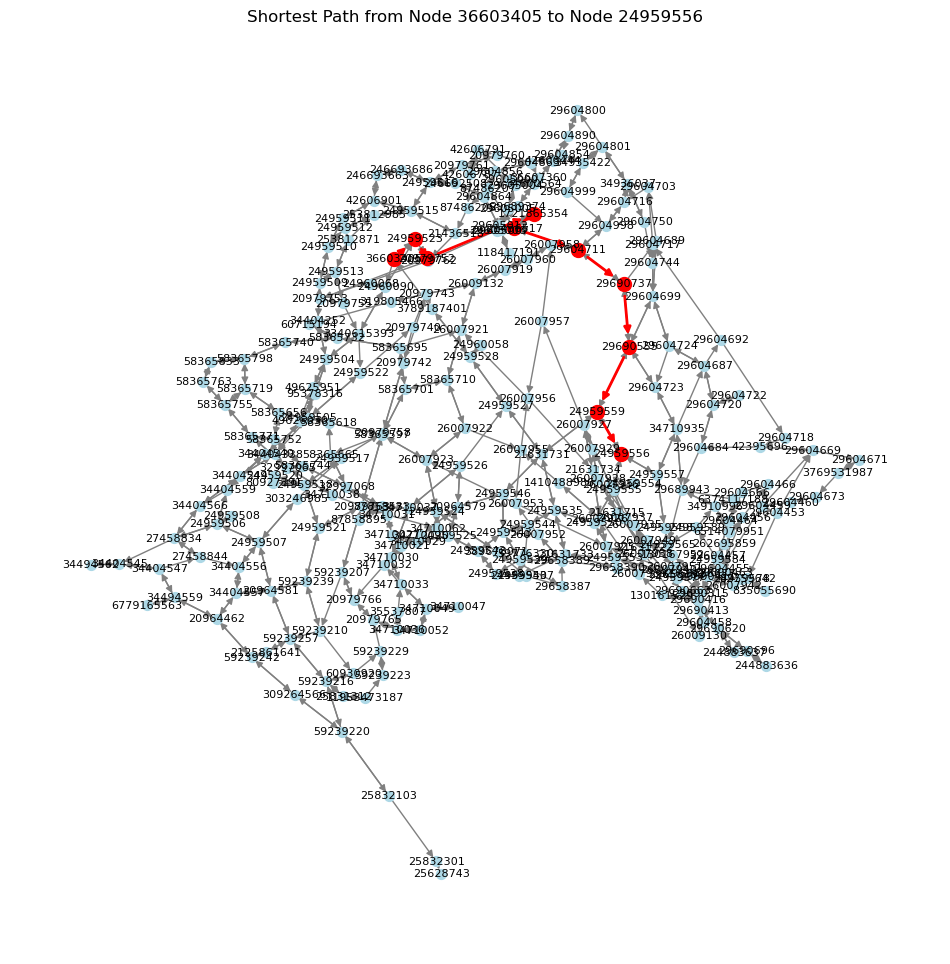

In [143]:
# Choose two nodes
# Get OpenStreetMap (OSM) node ID based on the point's GPS coordinate (X=longitude and Y=latitude)
node_start = ox.distance.nearest_nodes(graph, X=-79.392442, Y=43.664527) #King Edward VII Equestrian Statue
node_end = ox.distance.nearest_nodes(graph, X=-79.397669, Y=43.659659) #Bahen Centre for Information Technology at UofT

# # Randomly select two distinct nodes
# nodes = list(graph.nodes())
# node_start, node_end = random.sample(nodes, 2)  # Ensure two distinct nodes

# Compute the shortest path
shortest_path = nx.shortest_path(graph, source=node_start, target=node_end, weight='length')

# Compute the layout for nodes
pos = nx.spring_layout(graph, seed=42)  # Use other layouts if needed

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 12))

# Draw the graph
nx.draw(graph, pos, node_size=50, node_color='lightblue', edge_color='gray', with_labels=False, ax=ax)

# Highlight the shortest path
shortest_path_edges = list(zip(shortest_path[:-1], shortest_path[1:]))
nx.draw_networkx_nodes(graph, pos, nodelist=shortest_path, node_color='red', node_size=100, ax=ax)
nx.draw_networkx_edges(graph, pos, edgelist=shortest_path_edges, edge_color='red', width=2, ax=ax)

# Draw node labels (IDs)
nx.draw_networkx_labels(graph, pos, labels={node: node for node in graph.nodes()}, font_size=8, font_color='black', ax=ax)

plt.title(f"Shortest Path from Node {node_start} to Node {node_end}")
plt.show()

## Graph-based Features

Weisfeiler-Lehman Graph Hash is a graph kernel method used to to generate a unique hash or fingerprint for a graph, capturing its structural properties. I can be used to compare and classify graphs based on their structural similarity.

In [144]:
# Get the adjacency matrix of G1
adj_matrix = nx.to_numpy_array(G)

# Create a random permutation of the nodes
n = G.number_of_nodes()
np.random.seed(42)
permutation = np.random.permutation(n)

# Create the permutation matrix
P = np.zeros((n, n))
for i in range(n):
    P[i, permutation[i]] = 1

# Apply the permutation to the adjacency matrix: P*A*P^T
permuted_adj_matrix = P @ adj_matrix @ P.T

# Create the permuted graph from the permuted adjacency matrix
G_perm = nx.from_numpy_array(permuted_adj_matrix)

# Check if the graphs are isomorphic
iso_check = isomorphism.is_isomorphic(G, G_perm)
print(f"Are G and G_perm isomorphic? {iso_check}")

# Compute the Weisfeiler-Lehman graph hashes for both graphs
hash_G = nx.weisfeiler_lehman_graph_hash(G)
hash_G_perm = nx.weisfeiler_lehman_graph_hash(G_perm)

# Print the hashes
print(f"Weisfeiler-Lehman Graph Hash of G: {hash_G}")
print(f"Weisfeiler-Lehman Graph Hash of G_perm: {hash_G_perm}")

# Compare the hashes
are_hashes_equal = hash_G == hash_G_perm
print(f"Are the WL graph hashes of G and G_perm equal? {are_hashes_equal}")

Are G and G_perm isomorphic? True
Weisfeiler-Lehman Graph Hash of G: 73e82ec4abb35573179cd7127115378e
Weisfeiler-Lehman Graph Hash of G_perm: 73e82ec4abb35573179cd7127115378e
Are the WL graph hashes of G and G_perm equal? True


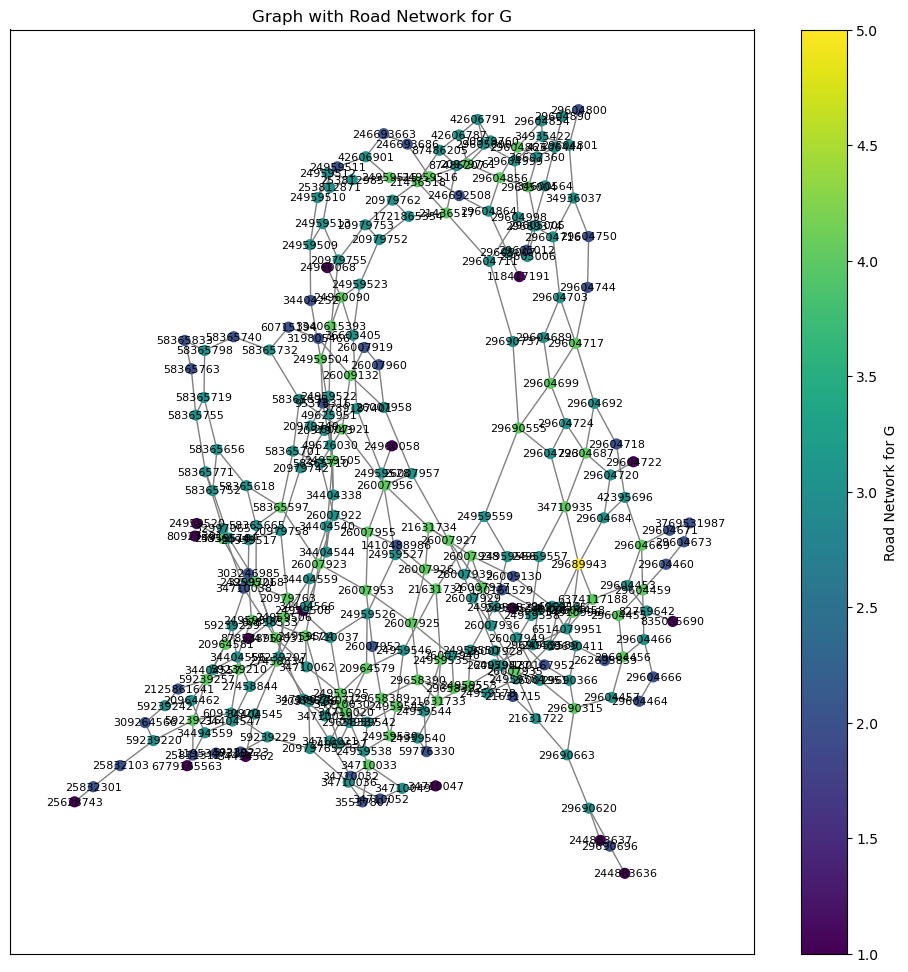

In [145]:
# Compute node degrees
node_degrees_G = dict(G.degree())

# Plot the graph
plot_graph(G, node_degrees_G, 'Road Network for G')

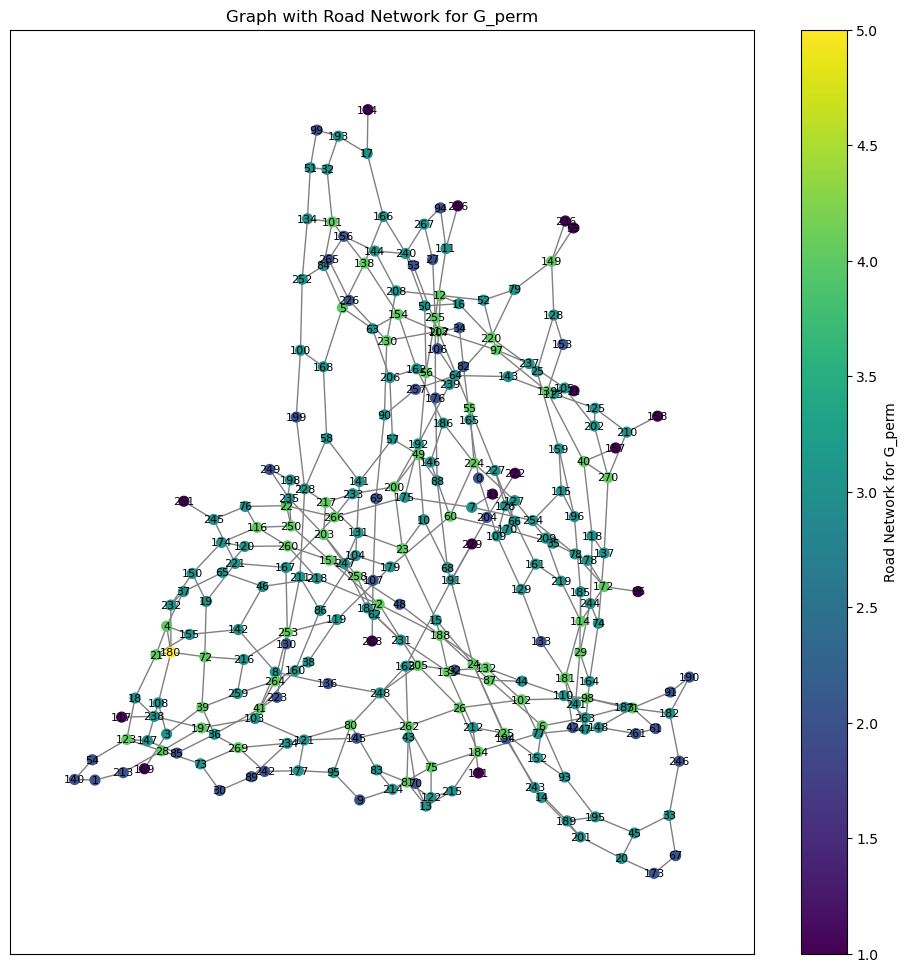

In [146]:
# Compute node degrees
node_degrees_G_perm = dict(G_perm.degree())

# Plot the graph
plot_graph(G_perm, node_degrees_G_perm,  'Road Network for G_perm')

### Communities

Communities refer to groups of nodes (intersections, street points) tha share common characteristics or functions such as geophgraphical similarity, functional similarity, traffic patterns or infrastructure (e.g., traffic signals, speed limits, or road types). 

In [147]:
# Detecting communities within a network based on betweenness centrality
communities_generator = nx.community.girvan_newman(graph)

top_level_communities = next(communities_generator)

next_level_communities = next(communities_generator)

# sorted(map(sorted, next_level_communities))

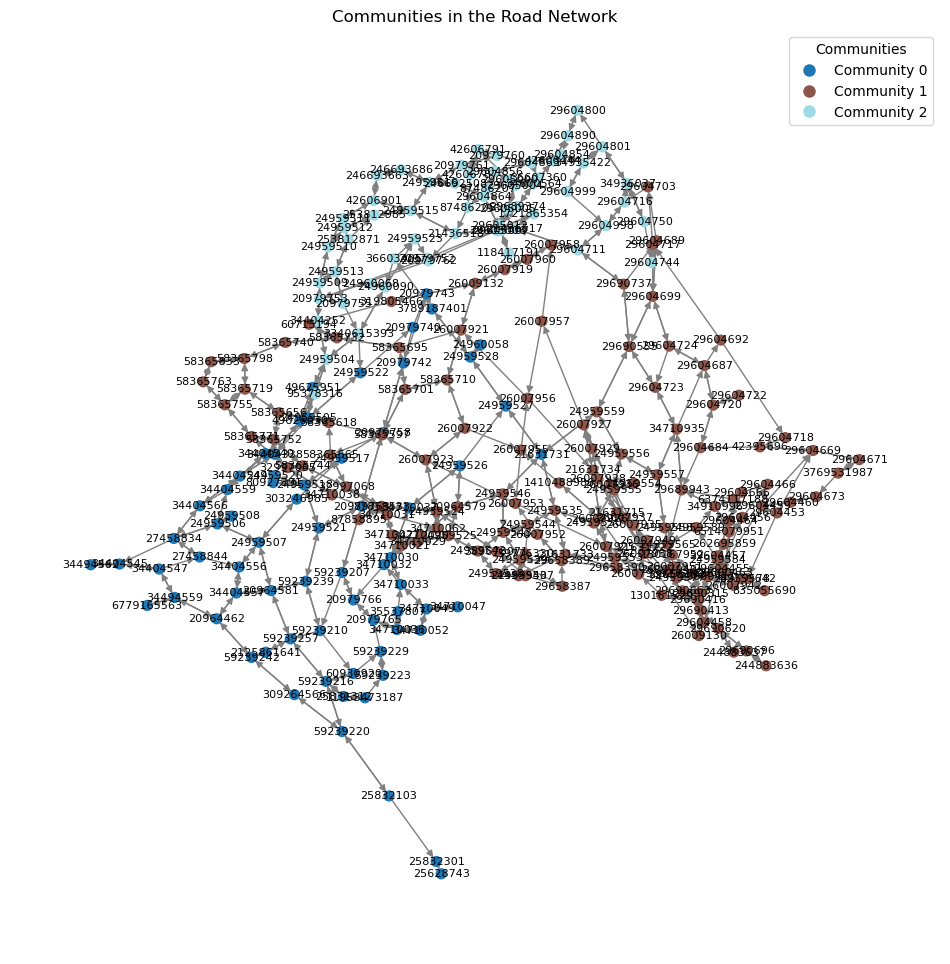

In [148]:
# Create a color map for visualization
community_colors = plt.get_cmap('tab20', len(next_level_communities)) # 'viridis

color_map = {}
for idx, community_nodes in enumerate(next_level_communities):
    for node in community_nodes:
        color_map[node] = community_colors(idx)

# Assign colors to nodes
node_colors = [color_map.get(node, 'gray') for node in graph.nodes()]

# Compute layout for visualization
pos = nx.spring_layout(graph, seed=42)

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 12))

# Draw the graph with community colors
nx.draw(graph, pos, node_color=node_colors, node_size=50, edge_color='gray', with_labels=False, ax=ax)

# Draw node labels (IDs)
nx.draw_networkx_labels(graph, pos, labels={node: node for node in graph.nodes()}, font_size=8, font_color='black', ax=ax)

# Create a legend for communities
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=community_colors(i), markersize=10, label=f'Community {i}') for i in range(len(next_level_communities))]
ax.legend(handles=handles, title='Communities', loc='upper right')

plt.title("Communities in the Road Network")
plt.show()


***
## Geospatial Data Analysis

### PySAL

[PySAL](https://pysal.org/) or Python Spatial Analysis Library is an open source cross-platform library for geospatial data science with an emphasis on geospatial vector data written in Python. 

### GeoDa

[GeoDa](https://geodacenter.github.io/) is a free and open source software tool that serves as an introduction to spatial data science. It is designed to facilitate new insights from data analysis by exploring and modeling spatial patterns.

### shapely

[Shapely](https://pypi.org/project/Shapely/) is a BSD-licensed Python package for manipulation and analysis of planar geometric objects. It provides us with datatypes to represent geometric objects that geopandas exploits to represent spatial data.


## Geocoding

### GeoPy

[GeoPy](https://geopy.readthedocs.io/en/stable/#)  is a Python client for several popular geocoding web services.


### nominatim

[nominatim](https://geopy.readthedocs.io/en/stable/#nominatim) is used to look up a location from a textual description (the official website description). This is called geocoding and decoding, which is translating address of a location to its coordinates (and vice-versa).

### Photon Geocoder

[photon](https://github.com/komoot/photon) is an open source geocoder built for OpenStreetMap data.

### Other geocoders

[Open Data and Open Source Geocoders](https://blog.batchgeo.com/open-data-open-source-geocoders/)


## Routing Libraries 

### osrm

For some problems, determining the route between multiple points is not the main focus, and it is acceptable to use a pre-generated route. [OSRM](http://project-osrm.org/) does exactly that; it is a routing engine with an API that you feed with coordinates, and in return it gives you the fastest route between them. It has other useful capabilities like doing Travelling Salesman and solving all pairs shortest path.

### Valhalla

[Valhalla](https://valhalla.readthedocs.io/en/latest/)'s routing service (a.k.a. turn-by-turn), is an open-source routing service that lets you integrate routing and navigation into a web or mobile application.

### Openrouteservice

The [openrouteservice - ORS](https://openrouteservice.org/) provides global spatial services by consuming user-generated and collaboratively collected free geographic data directly from OpenStreetMap. It is highly customizable, performant and written in Java.

### Routing

Geofabrik operates a [routing service](https://www.geofabrik.de/data/routing.html) based on [OSRM](http://project-osrm.org/). OSRM makes use of state-of-the-art routing algorithms and can compute routes across Europe within milliseconds. The engine supports the following features: via points, turn restrictions and turn maneuvers.


#### Other libraries

* [Geopy](https://github.com/geopy/geopy)
* [Geojson](https://github.com/jazzband/geojson)
* [Pyproj](https://lnkd.in/dNG9fdkm)
* [ArcGIS](https://developers.arcgis.com/python/)
* [Cartopy](https://github.com/SciTools/cartopy)
* [Gevent](http://www.gevent.org)
* [Fiona](https://fiona.readthedocs.io/en/stable/)
* [H3](https://h3geo.org/docs/)
* [KeplerGL](https://kepler.gl/)
* [Gdal](https://gdal.org/api/python_bindings.html)
* [PyQGIS](https://docs.qgis.org/3.22/en/docs/pyqgis_developer_cookbook/index.html)
* [Pydec](https://github.com/visgl/deck.gl/tree/master/bindings/pydeck)
* [PyGMT](https://www.pygmt.org)
* [Pyrosm](https://pyproj4.github.io/pyproj/stable/)
* [RTree](https://github.com/Toblerity/rtree)
* [Scikit-mobility](https://scikit-mobility.github.io/scikit-mobility/)
* [Rasterio](https://rasterio.readthedocs.io/en/stable/)
* [Openrouteservice](https://openrouteservice.org/)
* [Open3D](http://www.open3d.org/)

#### Projects

* [AI for Smart Mobility](https://medium.com/ai4sm)
* [Interactive Operations Research](https://interactive-or.com/)